In [9]:
from pathlib import Path
import numpy as np
import pandas as pd
from scipy.optimize import minimize, least_squares
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from tqdm import tqdm
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from adjustText import adjust_text

sns.set_style('ticks', rc={"axes.facecolor": (0, 0, 0, 0)})
sns.set_context('talk')

from matplotlib import rcParams
rcParams['font.family'] = 'DejaVu Sans'
#rcParams['font.family'] = 'sans-serif'
#rcParams['font.sans-serif'] = ['Arial']

pd.reset_option("display.max_colwidth")
pd.set_option("display.max_rows", None)

In [81]:
import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
import warnings

In [10]:
# Parameters
fc_thresh = 2
p_thresh = 0.05

In [64]:
# Paths
out_dir_V = Path("../../out/")
data_dir_V = Path("../../data/reference/")
data_dir = Path("../../data/")
contrast_file_V = data_dir / "contrast_table.tsv"
gff_V = data_dir_V / "D39V.gff3"

In [12]:
# load data
contrasts_V = pd.read_csv(contrast_file_V, sep="\t")
ref_V = pd.read_csv(gff_V, sep="\t", comment="#", header=None,
                     names=["seqid", "source", "type", "start", "end", "score", "strand", "phase", "attributes"])

## Get genes in paths of interest

In [13]:
# Filter for genes or CDS
genes = ref_V[ref_V["type"].isin(["gene", "CDS"])]

# Function to extract attributes
def parse_attributes(attr_str):
    attrs = {}
    for item in attr_str.split(";"):
        if "=" in item:
            k, v = item.split("=", 1)
            attrs[k] = v

    return pd.Series({
        "locus_tag": attrs.get("locus_tag", ""),
        "gene_id": attrs.get("gene", attrs.get("ID", "")),
        "gene_name": attrs.get("Name", attrs.get("gene", "")),
        "product": attrs.get("product", "")
    })

# Apply parsing
gene_attr = genes["attributes"].apply(parse_attributes)

# Combine with positional info
gene_df_V = pd.concat([genes[["seqid", "start", "end", "strand"]], gene_attr], axis=1)

In [14]:
dgVf = gene_df_V[gene_df_V.duplicated(subset="locus_tag", keep='first')]

In [15]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('com', case=False, na=False)).any(axis=1)
com = dgVf[mask]

In [16]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('lac', case=False, na=False)).any(axis=1)
lac = dgVf[mask]
lac

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2266,CP027540.1,429824,430168,+,SPV_0426,lacF-1,AVN85587.1,Lactose-specific PTS IIA component
2269,CP027540.1,430178,431590,+,SPV_0427,lacG-1,AVN85588.1,6-phospho-beta-galactosidase
2272,CP027540.1,431659,433338,+,SPV_0428,lacE-1,AVN85589.1,Lactose-specific PTS IIBC components
5324,CP027540.1,1073768,1074529,+,SPV_1044,lacR,AVN86153.1,Lactose phosphotransferase system repressor
5329,CP027540.1,1075027,1076433,-,SPV_1046,lacG-2,AVN86154.1,6-phospho-beta-galactosidase
5332,CP027540.1,1076642,1078333,-,SPV_1047,lacE-2,AVN86155.1,Lactose-specific PTS IIBC components
5334,CP027540.1,1078333,1078650,-,SPV_1048,lacF-2,AVN86156.1,Lactose-specific PTS IIA component
5338,CP027540.1,1078686,1079522,-,SPV_1049,lacT,AVN86157.1,Beta-glucoside bgl operon antiterminator LacT%...
5351,CP027540.1,1080737,1081666,-,SPV_1051,lacC,AVN86158.1,Tagatose-6-phosphate kinase LacC
5355,CP027540.1,1081677,1082192,-,SPV_1052,lacB,AVN86159.1,Galactose-6-phosphate isomerase%2C LacB subunit


In [17]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('gal', case=False, na=False)).any(axis=1)
gal = dgVf[mask]
gal

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
358,CP027540.1,71832,72869,+,SPV_0071,galM,AVN85244.1,Aldose 1-epimerase
7194,CP027540.1,1448715,1449734,-,SPV_1432,galE-1,AVN86511.1,UDP-glucose 4-epimerase
8118,CP027540.1,1627039,1628019,-,SPV_1612,galE-2,AVN86689.1,UDP-glucose 4-epimerase
8121,CP027540.1,1628032,1629507,-,SPV_1613,galT-1,AVN86690.1,Galactose-1-phosphate uridylyltransferase
8213,CP027540.1,1647079,1648560,-,SPV_1633,galT-2,AVN86704.1,Galactose-1-phosphate uridylyltransferase
8216,CP027540.1,1648579,1649757,-,SPV_1634,galK,AVN86705.1,Galactokinase
8227,CP027540.1,1649921,1650928,+,SPV_1635,galR,AVN86706.1,Galactose operon repressor%2C GalR-LacI family
9566,CP027540.1,1888745,1889644,+,SPV_1919,galU,AVN86922.1,UTP--glucose-1-phosphate uridylyltransferase


In [18]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('pgm', case=False, na=False)).any(axis=1)
pgm = dgVf[mask]
pgm

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
6639,CP027540.1,1341636,1343354,+,SPV_1326,pgm,AVN86409.1,Phosphoglucomutase


In [19]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('aro', case=False, na=False)).any(axis=1)
aro = dgVf[mask]
aro

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
6091,CP027540.1,1233854,1234330,-,SPV_1204,aroK,AVN86301.1,Shikimate kinase I
6094,CP027540.1,1234323,1235606,-,SPV_1205,aroA,AVN86302.1,5-Enolpyruvylshikimate-3-phosphate synthase
6108,CP027540.1,1237160,1238326,-,SPV_1208,aroC,AVN86305.1,Chorismate synthase
6111,CP027540.1,1238336,1239403,-,SPV_1209,aroB,AVN86306.1,3-dehydroquinate synthase
6114,CP027540.1,1239422,1240276,-,SPV_1210,aroE,AVN86307.1,Shikimate/quinate 5-dehydrogenase I beta
6116,CP027540.1,1240266,1240943,-,SPV_1211,aroD,AVN86308.1,3-dehydroquinate dehydratase I
7593,CP027540.1,1532234,1533265,-,SPV_1510,aroF,AVN86586.1,2-keto-3-deoxy-D-arabino-heptulosonate-7-phosp...
7595,CP027540.1,1533267,1534298,-,SPV_1511,aroG,AVN86587.1,2-keto-3-deoxy-D-arabino-heptulosonate-7-phosp...


In [20]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('sat', case=False, na=False)).any(axis=1)
sat = dgVf[mask]
sat

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
7504,CP027540.1,1509247,1510086,-,SPV_1493,satC,AVN86568.1,ABC transporter%2C putative N-acetylneuraminat...
7507,CP027540.1,1510102,1510989,-,SPV_1494,satB,AVN86569.1,ABC transporter%2C putative N-acetylneuraminat...
7510,CP027540.1,1511220,1512548,-,SPV_1495,satA,AVN86570.1,ABC transporter%2C putative N-acetylneuraminat...


In [21]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('shp', case=False, na=False)).any(axis=1)
shp = dgVf[mask]
shp

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
820,CP027540.1,150808,150888,-,SPV_2573,shp144,XFU36293.1,Signal peptide in Rgg144/SHP144 quorum-sensing...
5025,CP027540.1,1015296,1015367,-,SPV_2282,shp939,AVN86102.1,Signal peptide in Rgg939/SHP939 quorum-sensing...
7621,CP027540.1,1539963,1540064,-,SPV_2542,shp1518,USH90147.1,Pheromone in Rgg1518/SHP1518 quorum-sensing sy...


In [22]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('vp', case=False, na=False)).any(axis=1)
vp = dgVf[mask]
vp

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
832,CP027540.1,151109,151342,+,SPV_0145,vp1,AVN85321.1,Virulence peptide with glycine-glycine motif
841,CP027540.1,152053,152718,+,SPV_0147,vpoB,AVN85323.1,(Putative) Abi family transmembrane protease
844,CP027540.1,152790,154016,+,SPV_0148,vpoC,AVN85324.1,(Putative) Major facilitator superfamily 1 typ...
848,CP027540.1,154226,154822,+,SPV_0149,vpoD,AVN85325.1,(Putative) Branched chain amino acid transporter


In [23]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('rtg', case=False, na=False)).any(axis=1)
rtg = dgVf[mask]
rtg

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
599,CP027540.1,112681,113544,-,SPV_0112,rtgR,AVN85283.1,Transcriptional regulator of rtg locus
605,CP027540.1,113770,113814,+,SPV_2467,rtgS1,USH90072.1,Pheromone in Rtg/SHP-like quorum-sensing syste...
614,CP027540.1,116222,116689,+,SPV_0114,rtgX,AVN85284.1,(Putative) GyrI-like protein
616,CP027540.1,116686,118038,+,SPV_0115,rtgB,AVN85285.1,(Putative) RtgA transporter accessory protein
619,CP027540.1,118184,118564,+,SPV_0116,rtgC,AVN85286.1,Double-glycine peptide transported by RtgAB
630,CP027540.1,119733,119777,+,SPV_2470,rtgS2,USH90075.1,Pheromone in Rtg/SHP-like quorum-sensing syste...
633,CP027540.1,119812,119976,+,SPV_2099,rtgH,AVN85287.1,Protein in rtg locus (putative)
636,CP027540.1,120144,120515,+,SPV_0117,rtgK,AVN85288.1,(Putative) Double-glycine containing bacterioc...
638,CP027540.1,120523,120735,+,SPV_2100,rtgL,AVN85289.1,Protein in rtg locus (putative)
655,CP027540.1,121540,122598,+,SPV_0119,rtgP,AVN85292.1,(Putative) Integral membrane protein


In [24]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('cps', case=False, na=False)).any(axis=1)
cps = dgVf[mask]
cps

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
323,CP027540.1,64781,65524,-,SPV_0064,cpsR,AVN85237.1,Transcriptional regulator%2C GntR family
1750,CP027540.1,314201,315646,+,SPV_0315,cps2A,AVN85486.1,Exopolysaccharide biosynthesis transcriptional...
1753,CP027540.1,315648,316379,+,SPV_0316,cps2B,AVN85487.1,Tyrosine-protein phosphatase Cps2B
1756,CP027540.1,316388,317080,+,SPV_0317,cps2C,AVN85488.1,Capsular biosynthesis protein Cps2C
1759,CP027540.1,317090,317770,+,SPV_0318,cps2D,AVN85489.1,Tyrosine-protein kinase Cps2D
1761,CP027540.1,317785,319152,+,SPV_0319,cps2E,AVN85490.1,Undecaprenyl-phosphate galactosephosphotransfe...
1763,CP027540.1,319184,320368,+,SPV_0320,cps2T,AVN85491.1,Alpha-D-GlcNAc alpha-1%2C2-L-rhamnosyltransfer...
1767,CP027540.1,320361,321305,+,SPV_0321,cps2F,AVN85492.1,Alpha-L-Rha alpha-1%2C3-L-rhamnosyltransferase...
1770,CP027540.1,321321,322367,+,SPV_0322,cps2G,AVN85493.1,Glycosyltransferase Cps2G
1772,CP027540.1,322408,323571,+,SPV_0323,cps2H,AVN85494.1,Capsular synthesis protein Cps2H


In [25]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('mur', case=False, na=False)).any(axis=1)
mur = dgVf[mask]
mur

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2816,CP027540.1,548306,549526,+,SPV_0535,murM,AVN85689.1,tRNA-dependent lipid II--L-alanine/serine liga...
2819,CP027540.1,549531,550763,+,SPV_0536,murN,AVN85690.1,tRNA-dependent lipid II-Ala--L-alanine ligase ...
3156,CP027540.1,623359,624711,+,SPV_0598,murD,AVN85749.1,UDP-N-acetylmuramoylalanine--D-glutamate ligase
3158,CP027540.1,624715,625773,+,SPV_0599,murG,AVN85750.1,UDP-N-acetylglucosamine--N-acetylmuramyl-(pent...
4908,CP027540.1,982033,983292,-,SPV_0967,murA-1,AVN86076.1,UDP-N-acetylglucosamine 1-carboxyvinyltransferase
6182,CP027540.1,1254616,1255566,-,SPV_1222,murB,AVN86319.1,UDP-N-acetylenolpyruvoylglucosamine reductase
6749,CP027540.1,1362016,1363350,-,SPV_1349,murC,AVN86432.1,UDP-N-acetylmuramate--alanine ligase
6797,CP027540.1,1375387,1376832,+,SPV_1359,murE,AVN86439.1,UDP-N-acetylmuramoylalanyl-D-glutamate--L-lysi...
7119,CP027540.1,1436380,1437723,+,SPV_1416,murT,AVN86496.1,Mur ligase family protein
7461,CP027540.1,1498921,1500294,-,SPV_1483,murF,AVN86559.1,UDP-N-acetylmuramoyl-tripeptide--D-alanyl-D-al...


In [26]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('adh', case=False, na=False)).any(axis=1)
adh = dgVf[mask]
adh

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1476,CP027540.1,263864,264883,-,SPV_0265,adhA,AVN85438.1,Alcohol dehydrogenase
8231,CP027540.1,1650974,1652011,-,SPV_1636,adhB,AVN86707.1,Alcohol dehydrogenase
9190,CP027540.1,1819686,1822337,-,SPV_1834,adhE,AVN86860.1,Bifunctional acetaldehyde dehydrogenase/alcoho...
9313,CP027540.1,1844080,1845138,-,SPV_1865,adh,AVN86888.1,Putative Zn-dependent alcohol dehydrogenase
9919,CP027540.1,1958292,1959443,-,SPV_1985,adh2,AVN86987.1,Lactaldehyde dehydrogenase involved in fucose ...


In [27]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('scr', case=False, na=False)).any(axis=1)
scr = dgVf[mask]
scr

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
7714,CP027540.1,1553456,1554343,-,SPV_1531,scrK,AVN86608.1,Fructokinase
7720,CP027540.1,1554492,1556375,-,SPV_1532,scrA,AVN86609.1,Sucrose-specific PTS IIBCA components
7733,CP027540.1,1556752,1558206,+,SPV_1534,scrB,AVN86611.1,Sucrose-6-phosphate hydrolase
7735,CP027540.1,1558187,1559152,+,SPV_1535,scrR,AVN86612.1,Sucrose operon repressor ScrR%2C LacI family


In [28]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('arg', case=False, na=False)).any(axis=1)
arg = dgVf[mask]
arg

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
591,CP027540.1,109776,110972,+,SPV_0110,argG,AVN85281.1,Argininosuccinate synthase
595,CP027540.1,111001,112392,+,SPV_0111,argH,AVN85282.1,Argininosuccinate lyase
4104,CP027540.1,800875,801345,-,SPV_0786,argR2,AVN85915.1,Arginine pathway regulatory protein ArgR2
9502,CP027540.1,1876446,1876892,-,SPV_1904,argR1,AVN86908.1,Arginine pathway regulatory protein ArgR1
9520,CP027540.1,1877040,1878731,+,SPV_1905,argS,AVN86909.1,Arginyl-tRNA synthetase


In [29]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('lic', case=False, na=False)).any(axis=1)
lic = dgVf[mask]
lic

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
5701,CP027540.1,1154827,1155516,-,SPV_1123,licC,AVN86225.1,Cholinephosphate cytidylyltransferase LicC
5704,CP027540.1,1155528,1156406,-,SPV_1124,licB,AVN86226.1,Choline permease LicB
5706,CP027540.1,1156396,1157265,-,SPV_1125,licA,AVN86227.1,Choline kinase LicA
5730,CP027540.1,1160849,1161652,+,SPV_1129,licD1,AVN86231.1,Lipopolysaccharide cholinephosphotransferase L...
5733,CP027540.1,1161654,1162463,+,SPV_1130,licD2,AVN86232.1,Lipopolysaccharide cholinephosphotransferase L...
6076,CP027540.1,1230614,1231459,-,SPV_1201,licD3,AVN86298.2,Lipopolysaccharide cholinephosphotransferase L...


In [30]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('fts', case=False, na=False)).any(axis=1)
fts = dgVf[mask]
fts

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
54,CP027540.1,12174,14132,+,SPV_0013,ftsH,AVN85201.1,Cell division protein FtsH
1688,CP027540.1,302446,302763,+,SPV_0305,ftsL,AVN85478.1,Cell division protein FtsL
3461,CP027540.1,677465,678157,+,SPV_0659,ftsE,AVN85803.1,Cell division transporter%2C ATP-binding prote...
3463,CP027540.1,678150,679076,+,SPV_0660,ftsX,AVN85804.1,Cell division protein FtsX
4044,CP027540.1,786057,788360,+,SPV_0774,ftsK,AVN85904.1,DNA translocase FtsK
4981,CP027540.1,999483,1000712,-,SPV_0952,ftsW,AVN86090.1,Cell division protein FtsW
5604,CP027540.1,1132234,1133511,-,SPV_1101,ftsY,AVN86204.1,Signal recognition particle receptor FtsY
7444,CP027540.1,1494660,1495919,-,SPV_1479,ftsZ,AVN86555.1,Cell division protein FtsZ
7448,CP027540.1,1495936,1497309,-,SPV_1480,ftsA,AVN86556.1,Cell division protein FtsA


In [31]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('clp', case=False, na=False)).any(axis=1)
clp = dgVf[mask]
clp

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1710,CP027540.1,306558,308663,+,SPV_0308,clpL,AVN85481.1,Putative ATP-dependent Clp proteinase ATP-bind...
3406,CP027540.1,669424,670014,+,SPV_0650,clpP,AVN85794.1,ATP-dependent Clp protease proteolytic subunit...
3760,CP027540.1,731934,734192,-,SPV_0717,clpE,AVN85855.1,ATP-dependent Clp protease ATP-binding subunit...
6993,CP027540.1,1419415,1420647,-,SPV_1399,clpX,AVN86479.1,ATP-dependent Clp protease ATP-binding subunit...
10106,CP027540.1,2000918,2003350,-,SPV_2022,clpC,AVN87025.1,ATP-dependent Clp protease ATP-binding subunit...


In [32]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('dna', case=False, na=False)).any(axis=1)
dna = dgVf[mask]
dna

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2,CP027540.1,1,1362,+,SPV_0001,dnaA,AVN85189.1,Chromosomal replication initiator protein DnaA
11,CP027540.1,1521,2657,+,SPV_0002,dnaN,AVN85190.1,DNA polymerase III beta subunit
2449,CP027540.1,470045,471868,+,SPV_0460,dnaK,AVN85622.1,Chaperone protein DnaK
2454,CP027540.1,472628,473746,+,SPV_0461,dnaJ,AVN85624.1,Chaperone protein DnaJ
3969,CP027540.1,771080,772735,+,SPV_0760,dnaX,AVN85892.1,DNA polymerase III subunits gamma and tau
4115,CP027540.1,803981,807082,+,SPV_0788,dnaE,AVN85917.1,DNA polymerase III alpha subunit
4528,CP027540.1,891990,892580,+,SPV_0879,dnaQ,AVN86004.1,DNA polymerase III epsilon subunit
4953,CP027540.1,991810,993570,-,SPV_0957,dnaG,AVN86085.1,DNA primase
7029,CP027540.1,1424898,1425575,-,SPV_1405,dnaD,AVN86485.1,Chromosome replication initiation protein DnaD
7648,CP027540.1,1544179,1545075,-,SPV_1521,dnaI,AVN86598.1,Helicase loader DnaI


In [33]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('ula', case=False, na=False)).any(axis=1)
ula = dgVf[mask]
ula

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1512,CP027540.1,268528,269472,+,SPV_0269,sulA,AVN85443.1,Dihydropteroate synthase
4738,CP027540.1,949253,951532,-,SPV_1002,pulA,AVN86043.1,Putative glycogen debranching enzyme
9216,CP027540.1,1823940,1825916,-,SPV_1839,ulaH,AVN86864.1,Transketolase
9221,CP027540.1,1826030,1827121,-,SPV_1840,ulaG,AVN86865.1,Putative L-ascorbate-6-phosphate lactonase UlaG
9225,CP027540.1,1827233,1828906,-,SPV_1841,ulaR,AVN86866.1,Transcriptional antiterminator
9229,CP027540.1,1829085,1829789,-,SPV_1842,ulaF,AVN86867.1,L-ribulose-5-phosphate 4-epimerase
9231,CP027540.1,1829791,1830654,-,SPV_1843,ulaE,AVN86868.1,L-xylulose 5-phosphate 3-epimerase
9233,CP027540.1,1830658,1831323,-,SPV_1844,ulaD,AVN86869.1,3-keto-L-gulonate 6-phosphate decarboxylase
9237,CP027540.1,1831340,1831825,-,SPV_1845,ulaC,AVN86870.1,Ascorbate-specific PTS IIA component
9240,CP027540.1,1831902,1832183,-,SPV_1846,ulaB,AVN86871.1,Ascorbate-specific PTS IIB component


In [34]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('mal', case=False, na=False)).any(axis=1)
mal = dgVf[mask]
mal

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
3473,CP027540.1,679362,681542,+,SPV_0661,malT,AVN85805.1,Maltose- and glucose-specific PTS IICBA compon...
9646,CP027540.1,1903725,1905983,-,SPV_1932,malP,AVN86936.1,Maltodextrin phosphorylase
9649,CP027540.1,1906009,1907526,-,SPV_1933,malQ,AVN86937.1,4-alpha-glucanotransferase (amylomaltase)
9672,CP027540.1,1908076,1909347,+,SPV_1934,malX,AVN86938.1,Maltose/maltodextrin ABC transporter%2C substr...
9676,CP027540.1,1909458,1910750,+,SPV_1935,malC,AVN86939.1,Maltose/maltodextrin ABC transporter%2C permea...
9679,CP027540.1,1910752,1911594,+,SPV_1936,malD,AVN86940.1,Maltose/maltodextrin ABC transporter%2C permea...
9688,CP027540.1,1911847,1912647,+,SPV_1937,malA,AVN86941.1,Maltodextrose utilization protein MalA
9691,CP027540.1,1912657,1913643,+,SPV_1938,malR,AVN86942.1,Maltose operon transcriptional repressor MalR%...


In [35]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('pyr', case=False, na=False)).any(axis=1)
pyr = dgVf[mask]
pyr

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2348,CP027540.1,445010,446617,+,SPV_0442,pyrG,AVN85603.1,CTP synthase
3187,CP027540.1,632401,633102,+,SPV_0608,pyrF,AVN85756.1,Orotidine 5'-phosphate decarboxylase
3190,CP027540.1,633136,633768,+,SPV_0609,pyrE,AVN85757.1,Orotate phosphoribosyltransferase
3501,CP027540.1,685850,686785,+,SPV_0665,pyrDa,AVN85809.1,Dihydroorotate dehydrogenase (fumarate)
4328,CP027540.1,851211,851948,+,SPV_0834,pyrH,AVN85961.1,Uridine monophosphate kinase
4408,CP027540.1,865168,865968,+,SPV_0851,pyrK,AVN85976.1,Dihydroorotate dehydrogenase (NAD(+))%2C elect...
4411,CP027540.1,865979,866917,+,SPV_0852,pyrDb,AVN85977.1,Dihydroorotate dehydrogenase (NAD(+))%2C catal...
4598,CP027540.1,906760,908028,+,SPV_1030,pyrC,AVN86017.1,Dihydroorotase
5745,CP027540.1,1167356,1168279,-,SPV_1133,pyrB,AVN86235.1,Aspartate carbamoyltransferase
5748,CP027540.1,1168298,1168819,-,SPV_1134,pyrR,AVN86236.1,Bifunctional uracil phosphoribosyltransferase/...


In [36]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('deo', case=False, na=False)).any(axis=1)
deo = dgVf[mask]
deo

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1258,CP027540.1,218966,219712,+,SPV_0230,deoR,AVN85402.1,Transcriptional regulator%2C DeoR family
3812,CP027540.1,739262,740473,+,SPV_0724,deoB,AVN85862.1,Phosphopentomutase
3830,CP027540.1,744493,745203,+,SPV_0730,deoD,AVN85865.1,Purine nucleoside phosphorylase
3870,CP027540.1,749754,750416,+,SPV_0737,deoC,AVN85873.1,Deoxyribose-phosphate aldolase


In [37]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('fab', case=False, na=False)).any(axis=1)
fab = dgVf[mask]
fab

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2024,CP027540.1,383747,384532,+,SPV_0378,fabM,AVN85541.1,Trans-2%2Ccis-3-Decenoyl-ACP isomerase
2029,CP027540.1,384626,385060,+,SPV_0379,fabT,AVN85542.1,Transcriptional regulator of fatty acid biosyn...
2031,CP027540.1,385060,386034,+,SPV_0380,fabH,AVN85543.1,3-oxoacyl-(acyl-carrier-protein) synthase FabH
2041,CP027540.1,386437,387411,+,SPV_0382,fabK,AVN85545.1,Enoyl-(acyl-carrier-protein) reductase FabK
2045,CP027540.1,387404,388324,+,SPV_0383,fabD,AVN85546.1,Malonyl CoA-acyl carrier protein transacylase ...
2047,CP027540.1,388358,389089,+,SPV_0384,fabG1,AVN85547.1,3-oxoacyl-[acyl-carrier protein] reductase FabG1
2054,CP027540.1,389111,390346,+,SPV_0385,fabF,AVN85548.1,3-oxoacyl-(acyl-carrier-protein) synthase FabF
2058,CP027540.1,390831,391253,+,SPV_0387,fabZ,AVN85550.1,3-hydroxyacyl-(acyl-carrier-protein) dehydrata...
3665,CP027540.1,709252,709950,+,SPV_0695,fabG2,AVN85837.1,3-Ketoacyl-ACP reductase


In [38]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('pbp', case=False, na=False)).any(axis=1)
pbp = dgVf[mask]
pbp

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1692,CP027540.1,302767,305019,+,SPV_0306,pbp2x,AVN85479.1,Penicillin-binding protein 2X
1817,CP027540.1,340849,343008,-,SPV_0336,pbp1a,AVN85505.1,Multimodular transpeptidase-transglycosylase%2...
3998,CP027540.1,778496,779737,-,SPV_0767,pbp3,AVN85899.1,D-alanyl-D-alanine carboxypeptidase%2C penicil...
7473,CP027540.1,1502204,1504261,-,SPV_1486,pbp2b,AVN86562.2,Penicillin-binding protein 2B
9116,CP027540.1,1804718,1806913,-,SPV_1821,pbp2a,AVN86848.1,Multimodular transpeptidase-transglycosylase%2...
9600,CP027540.1,1894025,1896490,-,SPV_1925,pbp1b,AVN86928.1,Multimodular transpeptidase-transglycosylase%2...


In [39]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('upp', case=False, na=False)).any(axis=1)
r = dgVf[mask]
r

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1353,CP027540.1,234367,235125,+,SPV_0243,uppS,AVN85416.1,Undecaprenyl diphosphate synthase
2207,CP027540.1,417652,418497,+,SPV_0417,uppP,AVN85577.1,Undecaprenyl-diphosphatase
3396,CP027540.1,668600,669250,+,SPV_0649,upp,AVN85793.1,Uracil phosphoribosyltransferase


# other hits of interest
locus_tag in D39 : product

* SPD_RS10420: "beta-N-acetylhexosaminidase"
* SPD_RS10425: "ROK family protein"
* SPD_RS10430: "alpha-mannosidase"
* SPD_RS02385: "endo-beta-N-acetylglucosaminidase"

In [40]:
mask = dgVf[['product']].apply(lambda x: x.str.contains('ROK', case=False, na=False)).any(axis=1)
SPD_RS10425 = dgVf[mask]
SPD_RS10425

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product


In [41]:
mask = dgVf[['product']].apply(lambda x: x.str.contains('mannosidase', case=False, na=False)).any(axis=1)
SPD_RS10430 = dgVf[mask]
SPD_RS10430

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
9844,CP027540.1,1940686,1943331,-,SPV_1971,cds-AVN86975.1,AVN86975.1,Alpha-mannosidase
9854,CP027540.1,1944873,1946957,+,SPV_1973,cds-AVN86977.1,AVN86977.1,Alpha-1%2C2-mannosidase


In [42]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('gat', case=False, na=False)).any(axis=1)
gat = dgVf[mask]
gat

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
2093,CP027540.1,396925,398367,-,SPV_0396,gatB,AVN85559.1,Bifunctional aspartyl-tRNA(Asp) amidotransfera...
2095,CP027540.1,398367,399833,-,SPV_0397,gatA,AVN85560.1,Bifunctional aspartyl-tRNA(Asp) amidotransfera...
2098,CP027540.1,399833,400135,-,SPV_0398,gatC,AVN85561.1,Bifunctional aspartyl-tRNA(Asp) amidotransfera...
7123,CP027540.1,1437723,1438505,+,SPV_1417,gatD,AVN86497.1,Putative amidotransferase similar to cobyric a...


In [43]:
mask = dgVf[['product']].apply(lambda x: x.str.contains('aminidase', case=False, na=False)).any(axis=1)
SPD_RS10420_SPD_RS02385 = dgVf[mask]
SPD_RS10420_SPD_RS02385

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
318,CP027540.1,60528,64466,-,SPV_0063,strH,AVN85236.1,Beta-hexosaminidase StrH
1813,CP027540.1,335379,340682,+,SPV_0335,eng,AVN85504.1,Endo-alpha-N-acetylgalactosaminidase Eng
2363,CP027540.1,449100,454079,+,SPV_0444,endoD,AVN85605.1,Endo-beta-N-acetylglucosaminidase EndoD
3068,CP027540.1,607014,608003,+,SPV_0579,cbpL,AVN85730.1,Endo-beta-N-acetylglucosaminidase%2C choline-b...
4416,CP027540.1,867016,869124,+,SPV_0853,lytB,AVN85978.1,Endo-beta-N-acetylglucosaminidase LytB


In [44]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('cel', case=False, na=False)).any(axis=1)
cel = dgVf[mask]
cel

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1555,CP027540.1,275005,276441,+,SPV_0277,celA,AVN85451.1,6-phospho-beta-glucosidase
1566,CP027540.1,276862,277176,+,SPV_0279,celB,AVN85453.1,Cellobiose-specific PTS IIB component
1573,CP027540.1,277300,279273,+,SPV_0280,celR,AVN85454.1,Transcriptional antiterminator of lichenan ope...
1576,CP027540.1,279283,279597,+,SPV_0281,celC,AVN85455.1,Cellobiose-specific PTS IIA component
1582,CP027540.1,280202,281548,+,SPV_0283,celD,AVN85457.1,Cellobiose-specific PTS IIC component


In [45]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('bgl', case=False, na=False)).any(axis=1)
fus = dgVf[mask]
fus

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
1367,CP027540.1,239184,240563,+,SPV_0247,bglA,AVN85420.1,6-phospho-beta-glucosidase
2657,CP027540.1,508859,509698,+,SPV_0501,bglG,AVN85660.1,Beta-glucoside bgl operon antiterminator BglG
2660,CP027540.1,509716,511554,+,SPV_0502,bglF,AVN85661.1,Beta-glucoside-specific PTS IIBCA components
2663,CP027540.1,511567,512982,+,SPV_0503,bglA-2,AVN85662.1,6-phospho-beta-glucosidase


In [46]:
mask = dgVf[['product']].apply(lambda x: x.str.contains('transport', case=False, na=False)).any(axis=1)
transport = dgVf[mask]
#transport.to_excel("../../data/transporters.xlsx", index=None)

In [47]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('sat', case=False, na=False)).any(axis=1)
sat = dgVf[mask]
sat

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
7504,CP027540.1,1509247,1510086,-,SPV_1493,satC,AVN86568.1,ABC transporter%2C putative N-acetylneuraminat...
7507,CP027540.1,1510102,1510989,-,SPV_1494,satB,AVN86569.1,ABC transporter%2C putative N-acetylneuraminat...
7510,CP027540.1,1511220,1512548,-,SPV_1495,satA,AVN86570.1,ABC transporter%2C putative N-acetylneuraminat...


In [48]:
transport

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
268,CP027540.1,41902,44055,+,SPV_0049,comA,AVN85222.1,Competence-stimulating peptide ABC transporter...
271,CP027540.1,44068,45417,+,SPV_0050,comB,AVN85223.1,Competence-stimulating peptide ABC transporter...
466,CP027540.1,88263,89192,+,SPV_0088,cds-AVN85260.1,AVN85260.1,Multiple sugar ABC transporter%2C membrane-spa...
470,CP027540.1,89206,90129,+,SPV_0089,cds-AVN85261.1,AVN85261.1,ABC transporter permease protein
477,CP027540.1,90387,91862,+,SPV_0090,cds-AVN85262.1,AVN85262.1,ABC transporter substrate-binding protein
580,CP027540.1,108106,108747,+,SPV_0108,scaC,AVN85279.1,(Putative) Streptococcin A Transporter
588,CP027540.1,108953,109759,+,SPV_0109,apbA,AVN85280.1,(Putative) Substrate binding protein of amino ...
616,CP027540.1,116686,118038,+,SPV_0115,rtgB,AVN85285.1,(Putative) RtgA transporter accessory protein
619,CP027540.1,118184,118564,+,SPV_0116,rtgC,AVN85286.1,Double-glycine peptide transported by RtgAB
789,CP027540.1,145221,146837,+,SPV_0140,cds-AVN85316.1,AVN85316.1,ABC transporter ATP-binding protein


In [49]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('sus', case=False, na=False)).any(axis=1)
sus = dgVf[mask]
sus

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
7972,CP027540.1,1600138,1600983,-,SPV_1583,susT2,AVN86660.1,Transmembrane component of SuST1/SusT2 ABC Tra...
7974,CP027540.1,1600985,1601887,-,SPV_1584,susT1,AVN86661.1,Transmembrane component of SuST1/SusT2 ABC Tra...
7978,CP027540.1,1601983,1603293,-,SPV_1585,susX,AVN86662.1,Solute-binding lipoprotein component for SusT1...
7987,CP027540.1,1603420,1604415,-,SPV_1586,susR,AVN86663.1,Sucrose utilization system repressor


In [50]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('msm', case=False, na=False)).any(axis=1)
msm = dgVf[mask]
msm

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
7065,CP027540.1,1428569,1429699,-,SPV_1409,msmK,AVN86490.1,Multiple sugar ABC transporter%2C ATP-binding ...
8417,CP027540.1,1690779,1691612,-,SPV_1675,msmG,AVN86745.1,Multiple sugar ABC transporter%2C membrane-spa...
8420,CP027540.1,1691626,1692492,-,SPV_1676,msmF,AVN86746.1,Multiple sugar ABC transporter%2C membrane-spa...
8423,CP027540.1,1692506,1693765,-,SPV_1677,msmE,AVN86747.1,Multiple sugar ABC transporter%2C substrate-bi...
8435,CP027540.1,1696127,1696987,+,SPV_1679,msmR,AVN86749.1,Multiple sugar metabolism operon regulatory pr...


In [51]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('mal', case=False, na=False)).any(axis=1)
mal = dgVf[mask]
mal

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
3473,CP027540.1,679362,681542,+,SPV_0661,malT,AVN85805.1,Maltose- and glucose-specific PTS IICBA compon...
9646,CP027540.1,1903725,1905983,-,SPV_1932,malP,AVN86936.1,Maltodextrin phosphorylase
9649,CP027540.1,1906009,1907526,-,SPV_1933,malQ,AVN86937.1,4-alpha-glucanotransferase (amylomaltase)
9672,CP027540.1,1908076,1909347,+,SPV_1934,malX,AVN86938.1,Maltose/maltodextrin ABC transporter%2C substr...
9676,CP027540.1,1909458,1910750,+,SPV_1935,malC,AVN86939.1,Maltose/maltodextrin ABC transporter%2C permea...
9679,CP027540.1,1910752,1911594,+,SPV_1936,malD,AVN86940.1,Maltose/maltodextrin ABC transporter%2C permea...
9688,CP027540.1,1911847,1912647,+,SPV_1937,malA,AVN86941.1,Maltodextrose utilization protein MalA
9691,CP027540.1,1912657,1913643,+,SPV_1938,malR,AVN86942.1,Maltose operon transcriptional repressor MalR%...


In [52]:
mask = dgVf[['gene_id']].apply(lambda x: x.str.contains('gad', case=False, na=False)).any(axis=1)
gad = dgVf[mask]
gad

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
339,CP027540.1,67629,68105,+,SPV_0066,gadV,AVN85239.1,Galactosamine-specific PTS IIB component
342,CP027540.1,68133,69038,+,SPV_0067,gadW,AVN85240.1,Galactosamine-specific PTS IIC component
345,CP027540.1,69025,69840,+,SPV_0068,gadE,AVN85241.1,Galactosamine-specific PTS IID component
348,CP027540.1,69913,70251,+,SPV_0069,gadF,AVN85242.1,Galactosamine-specific PTS IIA component


In [53]:
transport

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
268,CP027540.1,41902,44055,+,SPV_0049,comA,AVN85222.1,Competence-stimulating peptide ABC transporter...
271,CP027540.1,44068,45417,+,SPV_0050,comB,AVN85223.1,Competence-stimulating peptide ABC transporter...
466,CP027540.1,88263,89192,+,SPV_0088,cds-AVN85260.1,AVN85260.1,Multiple sugar ABC transporter%2C membrane-spa...
470,CP027540.1,89206,90129,+,SPV_0089,cds-AVN85261.1,AVN85261.1,ABC transporter permease protein
477,CP027540.1,90387,91862,+,SPV_0090,cds-AVN85262.1,AVN85262.1,ABC transporter substrate-binding protein
580,CP027540.1,108106,108747,+,SPV_0108,scaC,AVN85279.1,(Putative) Streptococcin A Transporter
588,CP027540.1,108953,109759,+,SPV_0109,apbA,AVN85280.1,(Putative) Substrate binding protein of amino ...
616,CP027540.1,116686,118038,+,SPV_0115,rtgB,AVN85285.1,(Putative) RtgA transporter accessory protein
619,CP027540.1,118184,118564,+,SPV_0116,rtgC,AVN85286.1,Double-glycine peptide transported by RtgAB
789,CP027540.1,145221,146837,+,SPV_0140,cds-AVN85316.1,AVN85316.1,ABC transporter ATP-binding protein


In [54]:
mask = dgVf[['product']].apply(lambda x: x.str.contains('PTS', case=False, na=False)).any(axis=1)
PTS = dgVf[mask]
PTS

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product
339,CP027540.1,67629,68105,+,SPV_0066,gadV,AVN85239.1,Galactosamine-specific PTS IIB component
342,CP027540.1,68133,69038,+,SPV_0067,gadW,AVN85240.1,Galactosamine-specific PTS IIC component
345,CP027540.1,69025,69840,+,SPV_0068,gadE,AVN85241.1,Galactosamine-specific PTS IID component
348,CP027540.1,69913,70251,+,SPV_0069,gadF,AVN85242.1,Galactosamine-specific PTS IIA component
1268,CP027540.1,220900,221220,+,SPV_0232,cds-AVN85404.1,AVN85404.1,Cellobiose-specific PTS IIA component
1271,CP027540.1,221266,221574,+,SPV_0233,cds-AVN85405.1,AVN85405.1,Cellobiose-specific PTS IIB component
1274,CP027540.1,221591,222889,+,SPV_0234,cds-AVN85406.1,AVN85406.1,Cellobiose-specific PTS IIC component
1463,CP027540.1,260876,261787,-,SPV_0262,manN,AVN85435.1,Mannose-specific PTS IID component
1465,CP027540.1,261811,262614,-,SPV_0263,manM,AVN85436.1,Mannose-specific PTS IIC component
1467,CP027540.1,262642,263631,-,SPV_0264,manL,AVN85437.1,Mannose-specific PTS IIAB components


In [55]:
# patwhays
Transporters = ["cds-AVN85260.1", "cds-AVN85261.1", "cds-AVN85262.1",
               "xylH", "msmK", *sat["gene_id"].to_list(),
               "cds-AVN86575.1", "ycjO", "cds-AVN86577.1",
               *sus["gene_id"].to_list(), "pnuC", *msm["gene_id"].to_list(), "malX", "malC", "malD",
               *PTS["gene_id"].to_list()
               ]


C_dietary_glicans = [*scr["gene_id"].to_list(),
                     *cel["gene_id"].to_list(),
                     "fusA", "susX", "susT2", "susT1", "susR", "sfuB",
                     "agaN", "bglA", "bglG", "bglF", "bglA-2"
                    ]

# nanR = cds-AVN86565.1, cds-AVN86566.1, cds-AVN86573.1...
# alpha-mannosidase_ cds-AVN86977.1, cds-AVN86975.1
C_amino_sugar_Nglycans = [
    "bgaA","bgaC","nanA","nanB","nanP","nanE-1","nanK","nanR","nanE-2",
    *sat["gene_id"].to_list(),
    "manL","manN","manM","nagA","nagB","nagR","nagD",
    "cds-AVN86565.1","cds-AVN86566.1","yjgK","cds-AVN86573.1",
    "cds-AVN86575.1","ycjO","cds-AVN86577.1","cds-AVN86578.1",
    "cds-AVN86580.1","strH",
    *gat["gene_id"].to_list(),"cds-AVN86975.1", "cds-AVN86977.1",
    "endoD"    
]

others = ["eng", "endoD", "cbpL", "lytB", "cds-AVN86975.1", "cds-AVN86977.1"]

CRISPRi_hits = [
    "yajC", "yajC-1",
    *[g for g in ula["gene_id"].to_list() if g not in ["sulA", "pulA"]],
    "aldR", "mesH",
    *mal["gene_id"].to_list(),
    "mntR", "nha2",
    *pyr["gene_id"].to_list(),
    "holA", "holB", "fer", "aliA", "aliB", "trxA", "trxB", "yabA",
    *deo["gene_id"].to_list(),
    "cdd-1", "cdd-2", "adr", "rimI", "rimP", "rimM", "nusA", "nusB", "nusG",
    "infA", "infB", "infC", "rbfA", "recR", "prfA", "prfB", "prfC",
    "regR", "srtA", "gntR", "fld", "ctpA", "ctpC", "ctpE",
    "yfmL",
    *fab["gene_id"].to_list(),
    "mreD", "mreC", "acpP",
    *pbp["gene_id"].to_list(),
    "rodA", "nox", "paaI", "cls",
    "cbiQ", "cbiO2", "cbiO1", "gtrB", "udk", "prtA",
    "def1", "def2", "pgdA",
    "trmB", "trmD", "trmFO", "trmH",
    "dexB", "mocA", "pgm", "regR",
    "upp", "uppP", "uppS", "manL","manN","manM",
    "galR", "galE-1",
    *cel["gene_id"].to_list(),
    *[g for g in cps["gene_id"].to_list() if g != "acpS"],
    "gki", "tpiA",
    *lac["gene_id"].to_list(),
    "spxA2", "ackA", "licD2", "clpP", "groEL", "groES", "grpE", "dnaK", "dnaJ", "dnaE"
]

natural_competence = com["gene_id"].to_list()

# part of rtg: cds-AVN85290.1
peptide_signaling = [
    "mutR1",
    "mutR2",
    *shp["gene_id"].to_list(),
    *vp["gene_id"].to_list(),
    *rtg["gene_id"].to_list(),
    "pspA",
    "cds-AVN85290.1",
]

C_shikimate = [
    *aro["gene_id"].to_list(),
    "tyrA","tyrS","pheA","pheS","pheT"
]

Leloir_Tagatose=[
    *gal["gene_id"].to_list(),
    "pgm", "regR",
    *lac["gene_id"].to_list(), "gapN", "cds-AVN85712.1", "cds-AVN85713.1", "cds-AVN85714.1", "cds-AVN86162.1"
]

C_leloir = [
    *gal["gene_id"].to_list(),
    "pgm", "regR"
]
C_capsule = [g for g in cps["gene_id"].to_list() if g != "acpS"]

# PTS galactose: cds-AVN85712.1, cds-AVN85713.1, cds-AVN85714.1, cds-AVN86162.1
# cel genes are part of the Cellobiose PTS
C_tagatose = [*lac["gene_id"].to_list(), "gapN", "cds-AVN85712.1", "cds-AVN85713.1", "cds-AVN85714.1", "cds-AVN86162.1"]

C_pyruvate = ["ldh", "lctO", "pfl", "pflA", "spxB", "spxA1", "spxA2", "ackA", *adh["gene_id"].to_list()]

C_glycolisis = ["malT", "gki", "pgi", "pfkA", "tpiA", "fba", "gap", "pgk", "gpmA", "gpmB1", "gpmB2", "eno", "pyk"]

C_peptidoglycan = ["glmS", "glmU", "glmM", *mur["gene_id"].to_list()]

C_glycerol = ["glpO", "glpK", "cds-AVN87012.1"]

C_arginine = [*arg["gene_id"].to_list(), "ahrC"]

C_phosphorylcholine = ["tarJ", "tarI", *lic["gene_id"].to_list()]

heat_shock = [*fts["gene_id"].to_list(), *clp["gene_id"].to_list(), "ctsR", "groEL", "groES", "hrcA", "grpE", *dna["gene_id"].to_list()]

In [56]:
Transporters

['cds-AVN85260.1',
 'cds-AVN85261.1',
 'cds-AVN85262.1',
 'xylH',
 'msmK',
 'satC',
 'satB',
 'satA',
 'cds-AVN86575.1',
 'ycjO',
 'cds-AVN86577.1',
 'susT2',
 'susT1',
 'susX',
 'susR',
 'pnuC',
 'msmK',
 'msmG',
 'msmF',
 'msmE',
 'msmR',
 'malX',
 'malC',
 'malD',
 'gadV',
 'gadW',
 'gadE',
 'gadF',
 'cds-AVN85404.1',
 'cds-AVN85405.1',
 'cds-AVN85406.1',
 'manN',
 'manM',
 'manL',
 'celB',
 'celC',
 'celD',
 'cds-AVN85466.1',
 'cds-AVN85468.1',
 'cds-AVN85469.1',
 'cds-AVN85470.1',
 'mtlA',
 'mtlA2',
 'cds-AVN85585.1',
 'lacF-1',
 'lacE-1',
 'bglF',
 'cds-AVN85712.1',
 'cds-AVN85713.1',
 'cds-AVN85714.1',
 'malT',
 'fruA',
 'ptsI',
 'lacE-2',
 'lacF-2',
 'cds-AVN86162.1',
 'nanP',
 'scrA',
 'treP',
 'bguD',
 'bguB',
 'bguC',
 'ulaC',
 'ulaB',
 'ulaA',
 'ulaB2',
 'cds-AVN86991.1',
 'cds-AVN86992.1',
 'cds-AVN86993.1',
 'cds-AVN86994.1']

In [57]:
dict_colors = {"natural_competence":"#0165fc",
              "peptide_signaling":"xkcd:grass green",
               "C_amino_sugar_Nglycans": "xkcd:pale yellow",
               "C_shikimate": "xkcd:sunflower yellow",
               "C_leloir": "xkcd:goldenrod",
               "C_capsule": "xkcd:light orange",
               "C_tagatose": "xkcd:orange",
               "C_pyruvate": "xkcd:dark orange",
               "C_glycolisis": "xkcd:pumpkin",
               "C_peptidoglycan": "xkcd:burnt orange",
               "C_glycerol": "xkcd:rust",
               "C_dietary_glicans": "xkcd:reddish orange",
               "C_arginine": "xkcd:red",
               "C_phosphorylcholine": "xkcd:deep red",
               "heat_shock":"xkcd:maroon",
               "CRISPRi_hits":"xkcd:purple",
               "others":"#6e750e"
              }

In [58]:
dict_colors = {"natural_competence":"#8c000f",
              "peptide_signaling":"#8c000f",
               "C_amino_sugar_Nglycans": "#8c000f",
               "C_shikimate": "#8c000f",
               "C_leloir": "#8c000f",
               "C_capsule": "#8c000f",
               "C_tagatose": "#8c000f",
               "C_pyruvate": "#8c000f",
               "C_glycolisis": "#8c000f",
               "C_peptidoglycan": "#8c000f",
               "C_glycerol": "#8c000f",
               "C_dietary_glicans": "#8c000f",
               "C_arginine": "#8c000f",
               "C_phosphorylcholine": "#8c000f",
               "heat_shock":"#8c000f",
               "Transporters":"#8c000f",
               "Leloir_Tagatose":"#8c000f",
               "CRISPRi_hits":"#8c000f",
               "others":"#8c000f"
              }

## Plot Volcano

In [59]:
def volcano(df, gff_df=None, title="", fc_thresh=1, p_thresh=0.05,
                 highlight_genes=None, highlight_color="red", save_path=None):

    # Detect columns
    fc_col = [c for c in df.columns if 'log2' in c.lower() and 'fold' in c.lower()][0]
    padj_col = [c for c in df.columns if 'padj' in c.lower()][0]
    gene_col = next((c for c in df.columns if c.lower() in ['gene','feature_id','id']), 'gene')

    df = df.copy()
    df['gene'] = df[gene_col]

    # ---- map locus_tag to gene_id ----
    if gff_df is not None:
        locus_to_geneid = dict(zip(gff_df["locus_tag"], gff_df["gene_id"]))
        geneid_to_locus = dict(zip(gff_df["gene_id"], gff_df["locus_tag"]))
    
        df["gene_id"] = df["gene"].map(locus_to_geneid).fillna(df["gene"])
    
        # label logic
        df["label"] = np.where(
            df["gene_id"].astype(str).str.startswith("cds-"),
            df["gene_id"].map(geneid_to_locus).fillna(df["gene"]),
            df["gene_id"]
        )
    
    else:
        df["gene_id"] = df["gene"]
        df["label"] = df["gene"]

    # stats
    df[padj_col] = df[padj_col].replace(0, 1e-300)
    df['-log10(padj)'] = -np.log10(df[padj_col])

    # labels (use gene_id for consistency)
    #df['label'] = df["gene_id"]

    # ---- highlight pathway genes ----
    if highlight_genes is not None:
        highlight_set = set(highlight_genes)
        df['color'] = np.where(df['gene_id'].isin(highlight_set),
                               highlight_color, 'lightgrey')
    else:
        df['color'] = 'grey'

    # ---- alpha based on log2 fold change ----
    abs_fc = df[fc_col].abs()
    
    df['alpha'] = np.select(
        [
            abs_fc >= 2,
        ],
        [
            1
        ],
        default=0.5
    )

    # ---- Plot ----
    plt.figure(figsize=(7,7))

    if highlight_genes is not None:
        # background points (non-highlighted)
        bg = df[~df['gene_id'].isin(highlight_set)]
        plt.scatter(bg[fc_col], bg['-log10(padj)'],
                    c='lightgrey', alpha=0.5, edgecolors='none', zorder=1)

        # highlighted points (alpha = 1)
        hl = df[df['gene_id'].isin(highlight_set)]
        plt.scatter(hl[fc_col], hl['-log10(padj)'],
                    c=highlight_color, alpha=hl['alpha'], edgecolors='none', zorder=2)
    else:
        plt.scatter(df[fc_col], df['-log10(padj)'],
                    c='grey', alpha=0.7, edgecolors='none', zorder=1)

    plt.axhline(-np.log10(p_thresh), color='grey', linestyle='--')
    plt.axvline(fc_thresh, color='grey', linestyle='--')
    plt.axvline(-fc_thresh, color='grey', linestyle='--')

    # ---- Annotate ONLY highlighted genes passing log2 FC threshold ----
    if highlight_genes is not None:
        sub = df[
            (df['gene_id'].isin(highlight_set)) &
            (df[fc_col].abs() > fc_thresh)  # or use a separate log_threshold
        ]
        texts = [
            plt.text(r[fc_col], r['-log10(padj)'], r['label'], fontsize=14)
            for _, r in sub.iterrows()
        ]
        adjust_text(texts,
                    arrowprops=dict(arrowstyle='-', color='black', lw=0.25))

    # Limits
    xlim = max(abs(df[fc_col].max()), abs(df[fc_col].min()))
    plt.xlim(-xlim*1.05, xlim*1.05)
    plt.ylim(-30, df['-log10(padj)'].max()*1.05)

    plt.xlabel("log2 Fold Change")
    plt.ylabel("-log10 adjusted Pvalue")
    plt.title(title)
    plt.gca().set_facecolor("white")

    if save_path:
        plt.tight_layout()
        plt.savefig(save_path, dpi=150)

    plt.show()

In [60]:
pathways = {
    "others":others
}

In [61]:
pathways = {
    "natural_competence":natural_competence,
    "peptide_signaling":peptide_signaling,
    "heat_shock":heat_shock,
    "CRISPRi_hits":CRISPRi_hits,
    "C_amino_sugar_Nglycans": C_amino_sugar_Nglycans,
    "C_shikimate": C_shikimate,
    "C_leloir": C_leloir,
    "C_capsule": C_capsule,
    "C_tagatose": C_tagatose,
    "C_pyruvate": C_pyruvate,
    "C_glycolisis": C_glycolisis,
    "C_peptidoglycan": C_peptidoglycan,
    "C_glycerol": C_glycerol,
    "C_dietary_glicans": C_dietary_glicans,
    "C_arginine": C_arginine,
    "C_phosphorylcholine": C_phosphorylcholine,
    "Transporters":Transporters,
    "Leloir_Tagatose":Leloir_Tagatose
}

In [62]:
gene_to_pathway = {}
for pathway, genes in pathways.items():
    for g in genes:
        gene_to_pathway[g] = pathway

# Add pathway column
dgVf["pathway"] = dgVf["gene_id"].map(gene_to_pathway)

# Filter rows with a pathway assigned
filtered_df = dgVf.dropna(subset=["pathway"])

# Save to CSV
filtered_df.to_csv("../../out/dgVF_with_pathways.csv", index=False)
filtered_df.to_excel("../../out/dgVF_with_pathways.xlsx", index=False)
dgVf.to_excel("../../out/dgVF.xlsx", index=False)

/scratch/local/6390571/ipykernel_2043255/116331771.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dgVf["pathway"] = dgVf["gene_id"].map(gene_to_pathway)


In [63]:
dgVf

,seqid,start,end,strand,locus_tag,gene_id,gene_name,product,pathway
2,CP027540.1,1,1362,+,SPV_0001,dnaA,AVN85189.1,Chromosomal replication initiator protein DnaA,heat_shock
11,CP027540.1,1521,2657,+,SPV_0002,dnaN,AVN85190.1,DNA polymerase III beta subunit,heat_shock
15,CP027540.1,2722,2916,+,SPV_0003,cds-AVN85191.1,AVN85191.1,Hypothetical protein,NaN
22,CP027540.1,3000,4115,+,SPV_0004,ychF,AVN85192.1,GTP-binding and nucleic acid-binding protein YchF,NaN
26,CP027540.1,4186,4755,+,SPV_0005,pth,AVN85193.1,Peptidyl-tRNA hydrolase,NaN
28,CP027540.1,4756,8265,+,SPV_0006,mfd,AVN85194.1,Transcription-repair coupling factor,NaN
33,CP027540.1,8323,8589,+,SPV_0007,cds-AVN85195.1,AVN85195.1,Ribosome-associated heat shock protein,NaN
35,CP027540.1,8582,8950,+,SPV_0008,divIC,AVN85196.1,Cell division protein DivIC,NaN
38,CP027540.1,8955,9077,+,SPV_0009,cds-AVN85197.1,AVN85197.1,Hypothetical protein,NaN
41,CP027540.1,9070,10338,+,SPV_0010,cds-AVN85198.1,AVN85198.1,Hypothetical protein,NaN


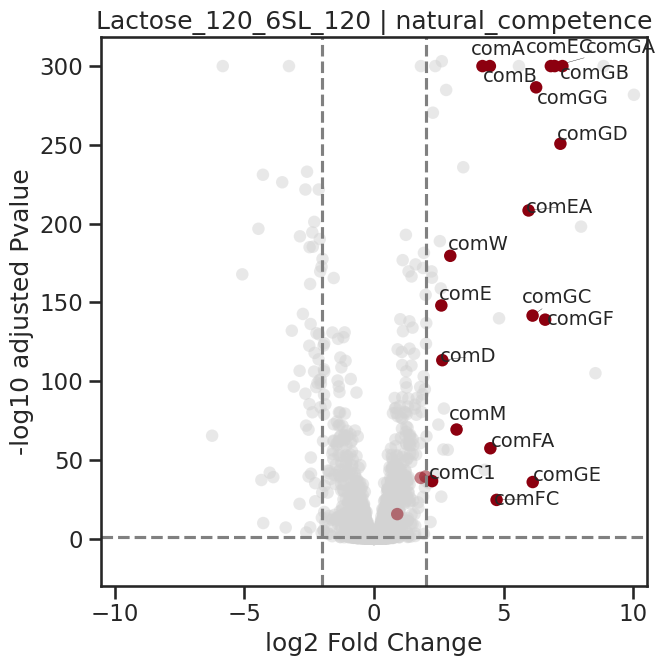

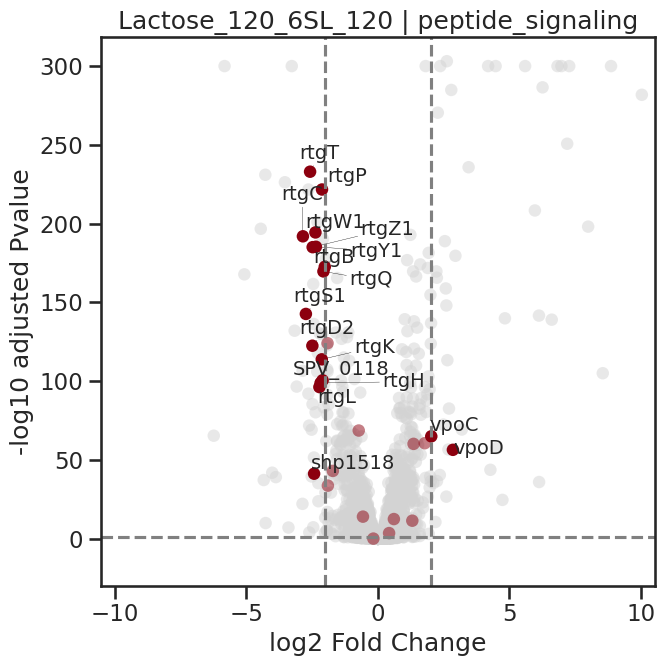

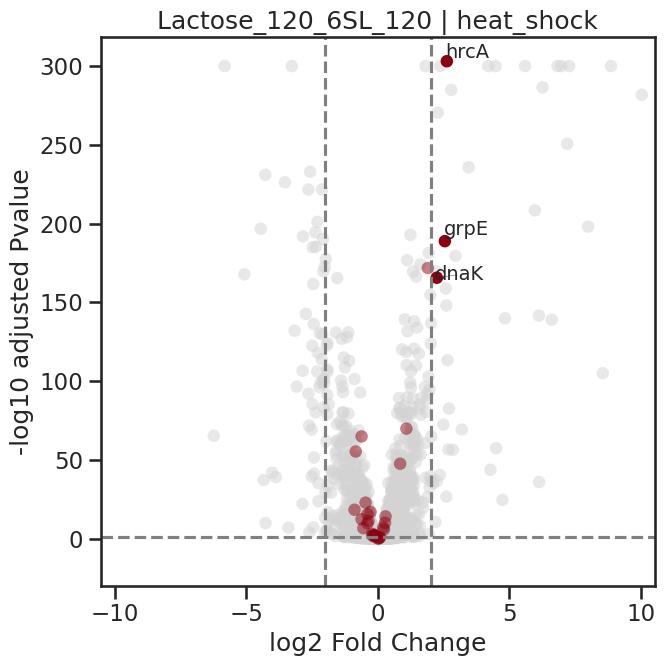

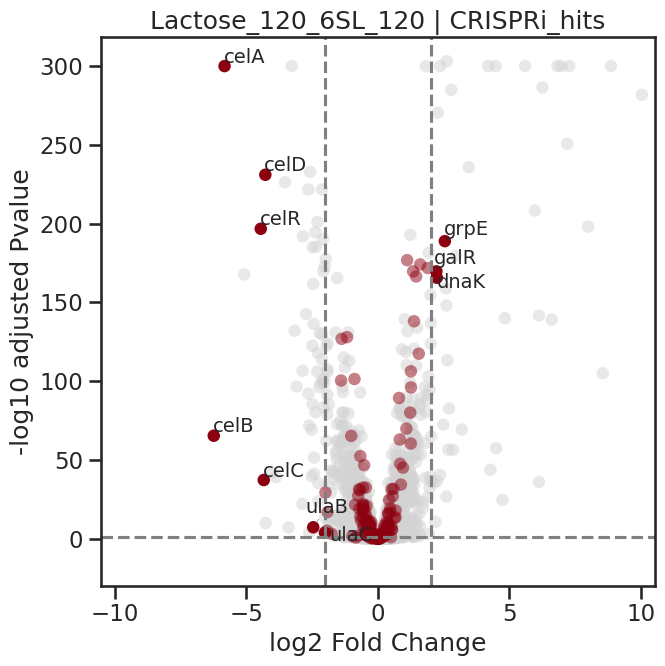

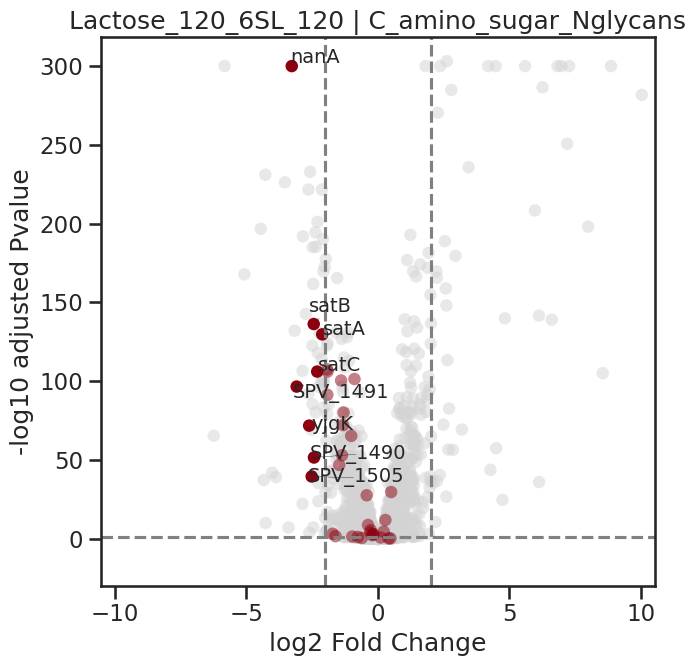

...

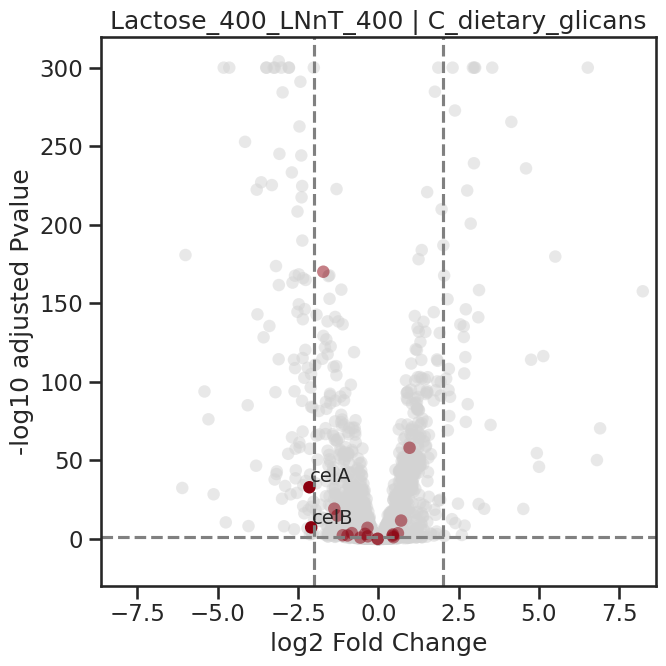

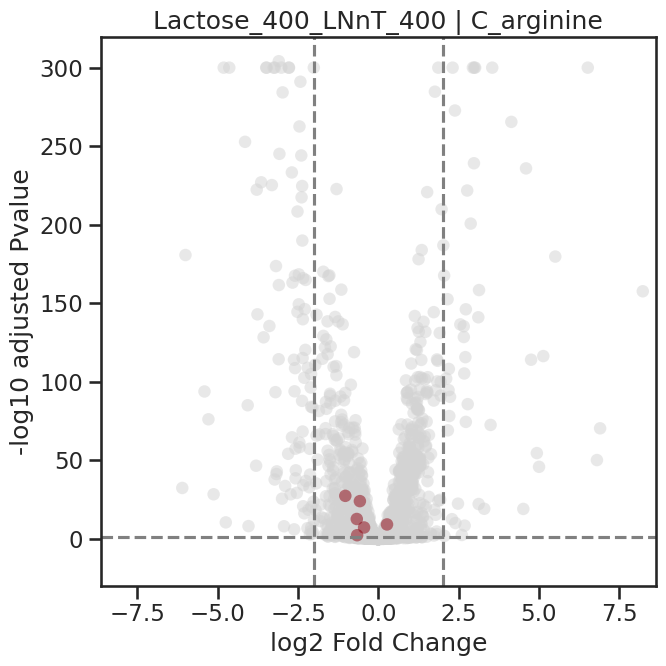

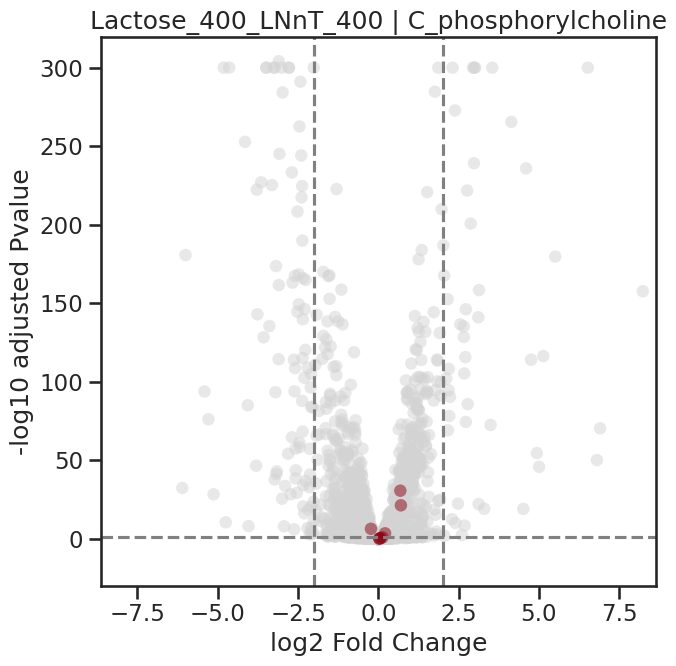

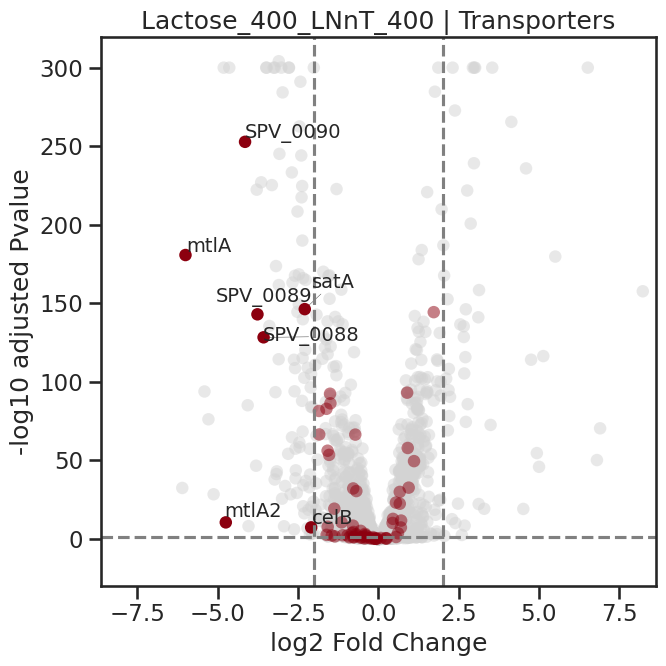

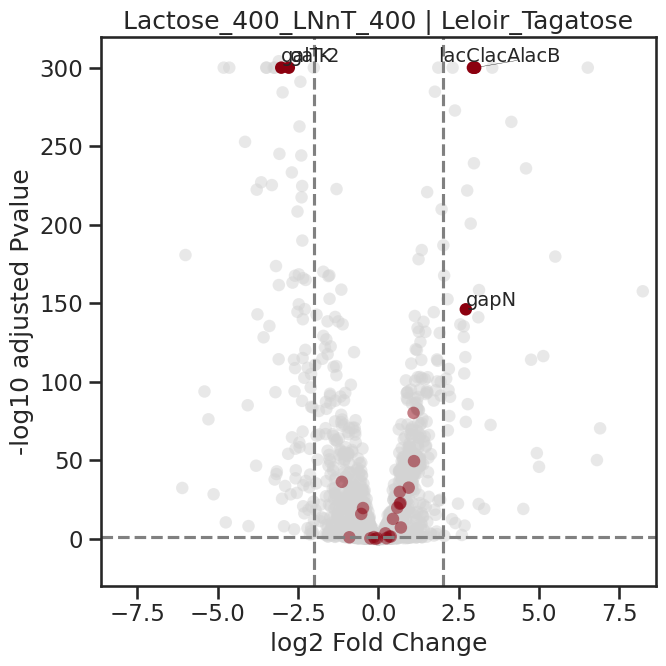

In [65]:
# files of interest are:
files_name = ["DGE_Lactose_120_6SL_120.tsv", "DGE_Lactose_120_LNnT_120.tsv", "DGE_Lactose_400_6SL_400.tsv", "DGE_Lactose_400_LNnT_400.tsv"]

# Loop through DGE files
for fname in files_name:
    file = out_dir_V / fname
    df = pd.read_csv(file, sep="\t")
    contrast_name = file.stem.replace("DGE_", "")

    for pathway_name, genes in pathways.items():
        volcano(
            df,
            gff_df=dgVf,
            title=f"{contrast_name} | {pathway_name}",
            fc_thresh=2,
            p_thresh=p_thresh,
            highlight_genes=genes,
            highlight_color=dict_colors[pathway_name],
            save_path=out_dir_V / f"figures/{contrast_name}_{pathway_name}_volcano.png"
        )

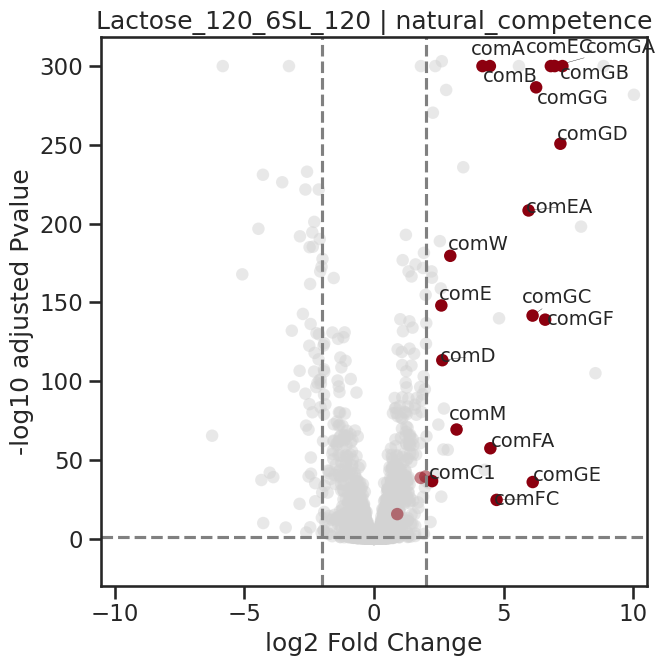

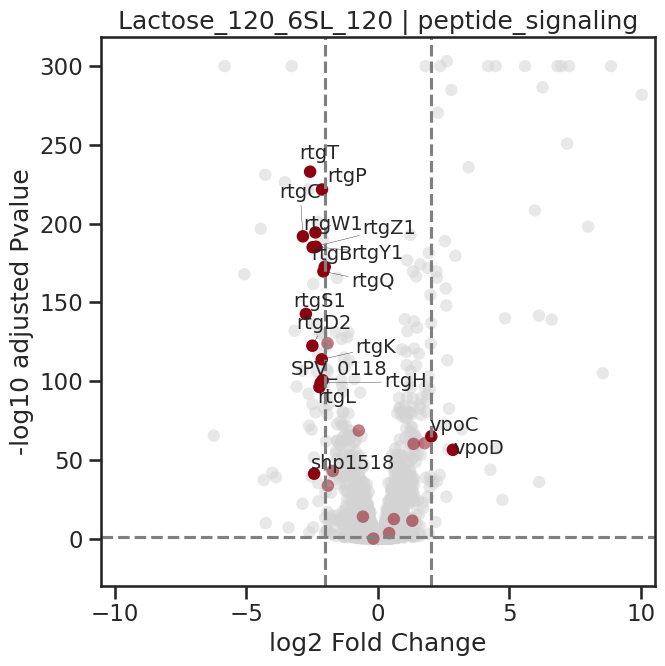

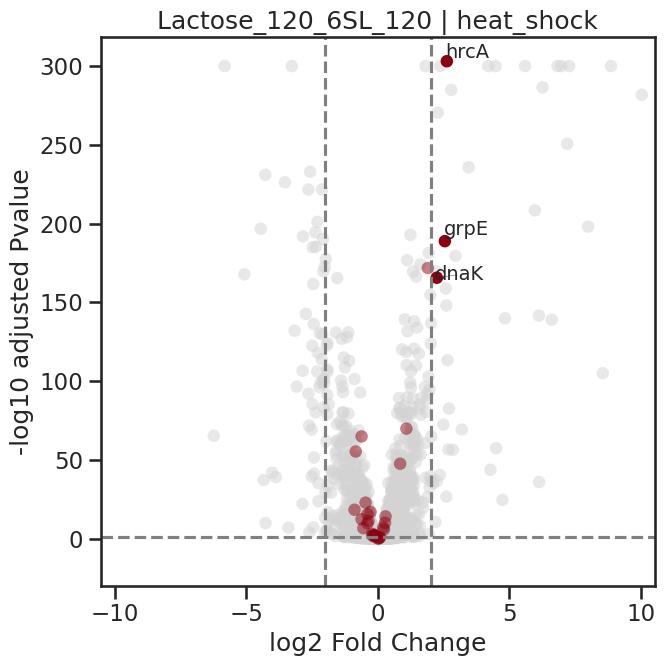

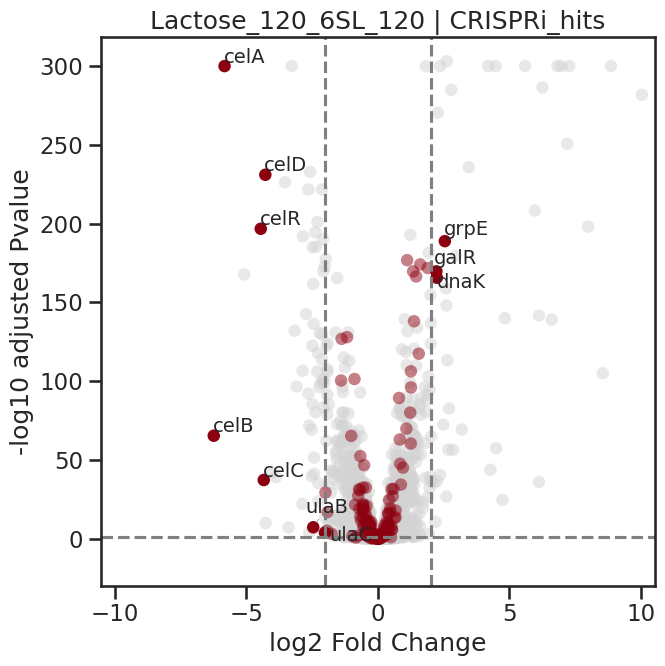

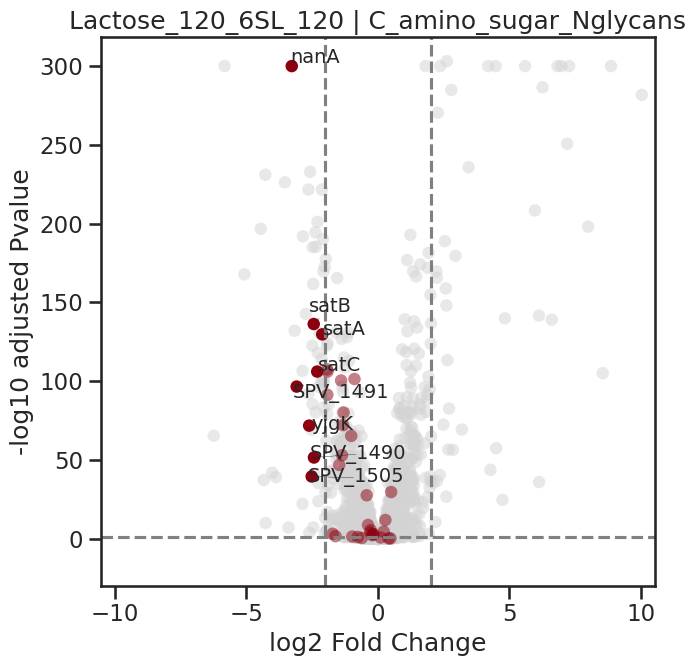

...

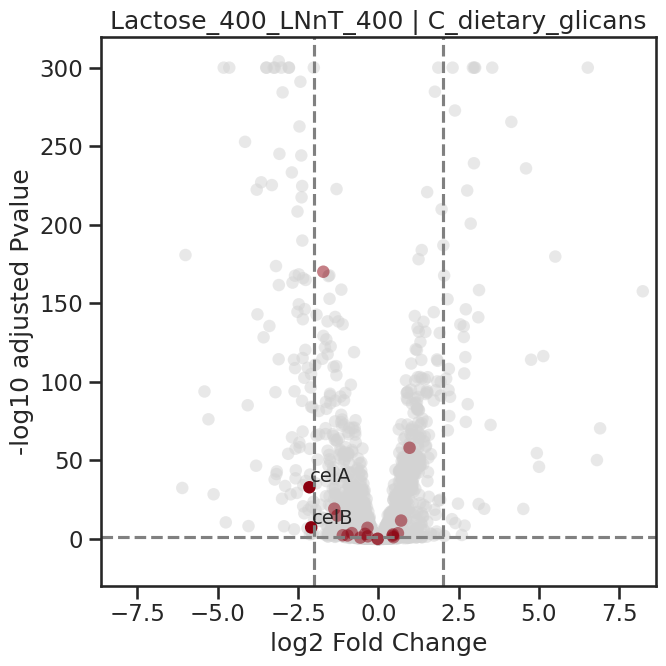

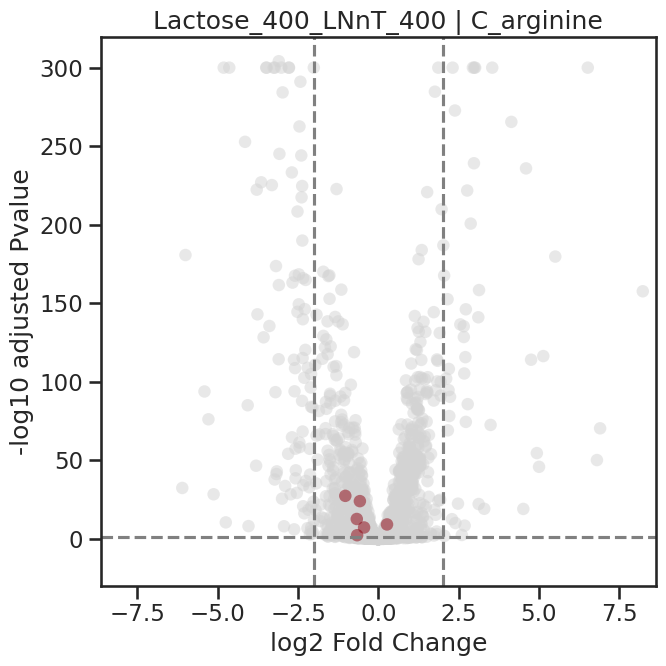

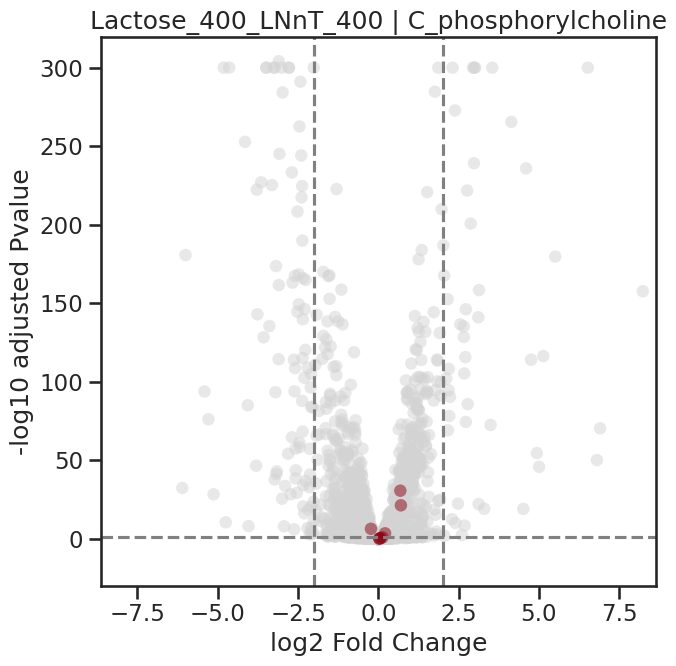

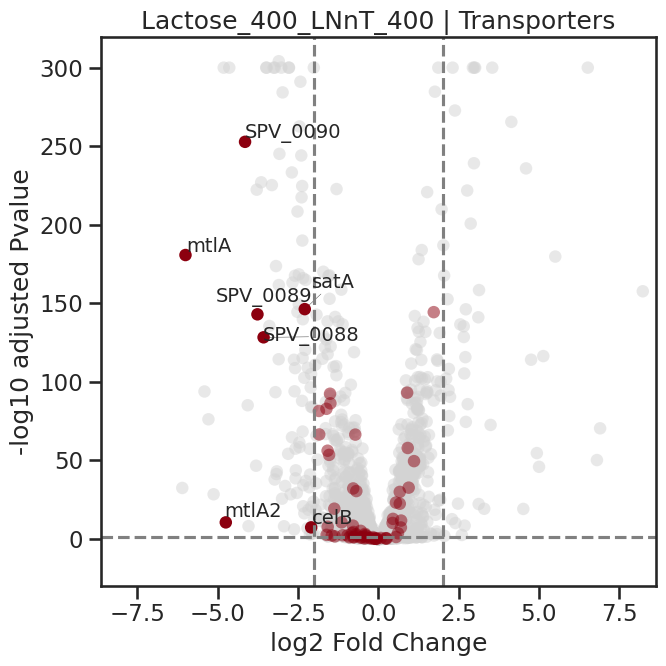

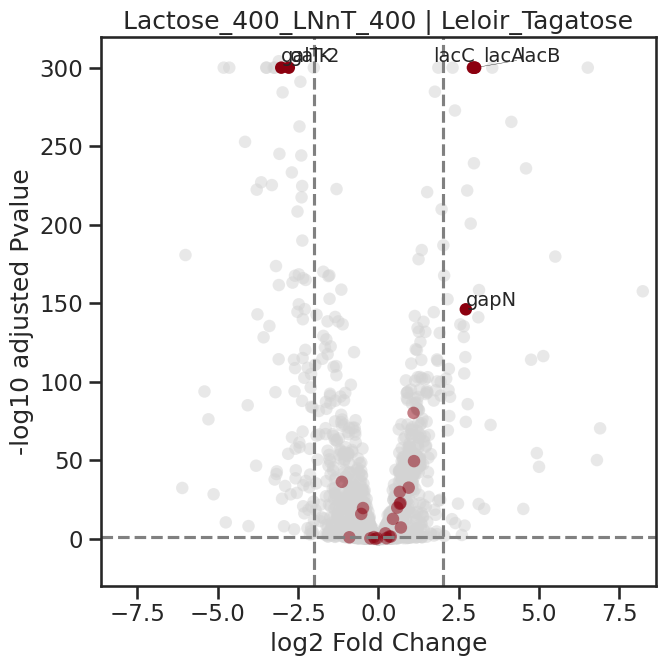

In [66]:
# files of interest are:
#files_name = ["DGE_Lactose_120_Lactose_400.tsv", "DGE_LNnT_120_LNnT_400.tsv", "DGE_6SL_120_6SL_400.tsv"]
files_name = ["DGE_Lactose_120_6SL_120.tsv", "DGE_Lactose_120_LNnT_120.tsv", "DGE_Lactose_400_6SL_400.tsv", "DGE_Lactose_400_LNnT_400.tsv"]

# Loop through DGE files
for fname in files_name:
    file = out_dir_V / fname
    df = pd.read_csv(file, sep="\t")
    contrast_name = file.stem.replace("DGE_", "")

    for pathway_name, genes in pathways.items():
        volcano(
            df,
            gff_df=dgVf,
            title=f"{contrast_name} | {pathway_name}",
            fc_thresh=2,
            p_thresh=p_thresh,
            highlight_genes=genes,
            highlight_color=dict_colors[pathway_name],
            save_path=out_dir_V / f"figures/{contrast_name}_{pathway_name}_volcano.pdf"
        )

In [67]:
def volcano_highlight(df, gff_df=None, title="", fc_thresh=1, p_thresh=0.05,
                 highlight_genes=None, highlight_color="red", save_path=None):

    # Detect columns
    fc_col = [c for c in df.columns if 'log2' in c.lower() and 'fold' in c.lower()][0]
    padj_col = [c for c in df.columns if 'padj' in c.lower()][0]
    gene_col = next((c for c in df.columns if c.lower() in ['gene','feature_id','id']), 'gene')

    df = df.copy()
    df['gene'] = df[gene_col]

    # ---- map locus_tag to gene_id ----
    if gff_df is not None:
        locus_to_geneid = dict(zip(gff_df["locus_tag"], gff_df["gene_id"]))
        df["gene_id"] = df["gene"].map(locus_to_geneid).fillna(df["gene"])
    else:
        df["gene_id"] = df["gene"]

    # stats
    df[padj_col] = df[padj_col].replace(0, 1e-300)
    df['-log10(padj)'] = -np.log10(df[padj_col])

    # labels (use gene_id for consistency)
    df['label'] = df["gene_id"]

    # ---- highlight pathway genes ----
    if highlight_genes is not None:
        highlight_set = set(highlight_genes)
        df['color'] = np.where(df['gene_id'].isin(highlight_set),
                               highlight_color, 'lightgrey')
    else:
        df['color'] = 'grey'

    # ---- Plot ----
    plt.figure(figsize=(7,7))

    if highlight_genes is not None:
        # background points (non-highlighted)
        bg = df[~df['gene_id'].isin(highlight_set)]
        plt.scatter(bg[fc_col], bg['-log10(padj)'],
                    c='lightgrey', alpha=0.3, edgecolors='none', zorder=1)

        # highlighted points (alpha = 1)
        hl = df[df['gene_id'].isin(highlight_set)]
        plt.scatter(hl[fc_col], hl['-log10(padj)'],
                    c=highlight_color, alpha=1, edgecolors='none', zorder=2)
    else:
        plt.scatter(df[fc_col], df['-log10(padj)'],
                    c='grey', alpha=0.7, edgecolors='none', zorder=1)

    plt.axhline(-np.log10(p_thresh), color='grey', linestyle='--')
    plt.axvline(fc_thresh, color='grey', linestyle='--')
    plt.axvline(-fc_thresh, color='grey', linestyle='--')

    # ---- Annotate ONLY highlighted genes with |log2FC| > fc_thresh ----
    if highlight_genes is not None:
        sub = df[df['gene_id'].isin(highlight_set) & (df[fc_col].abs() > fc_thresh)]
        texts = [
            plt.text(r[fc_col], r['-log10(padj)'], r['label'], fontsize=14)
            for _, r in sub.iterrows()
        ]
        adjust_text(texts,
                    arrowprops=dict(arrowstyle='-', color='black', lw=0.25))

    # Limits
    xlim = max(abs(df[fc_col].max()), abs(df[fc_col].min()))
    plt.xlim(-xlim*1.05, xlim*1.05)
    plt.ylim(-30, df['-log10(padj)'].max()*1.05)

    plt.xlabel("log2 Fold Change")
    plt.ylabel("-log10 adjusted Pvalue")
    plt.title(title)
    plt.gca().set_facecolor("white")

    if save_path:
        plt.tight_layout()
        plt.savefig(save_path, dpi=150)

    plt.show()

In [68]:
pathways = {
    "CRISPRi_hits":CRISPRi_hits
}

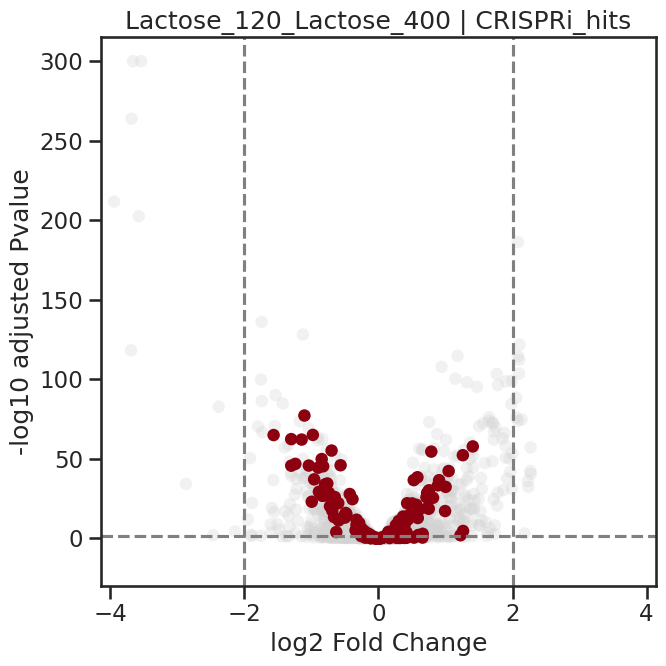

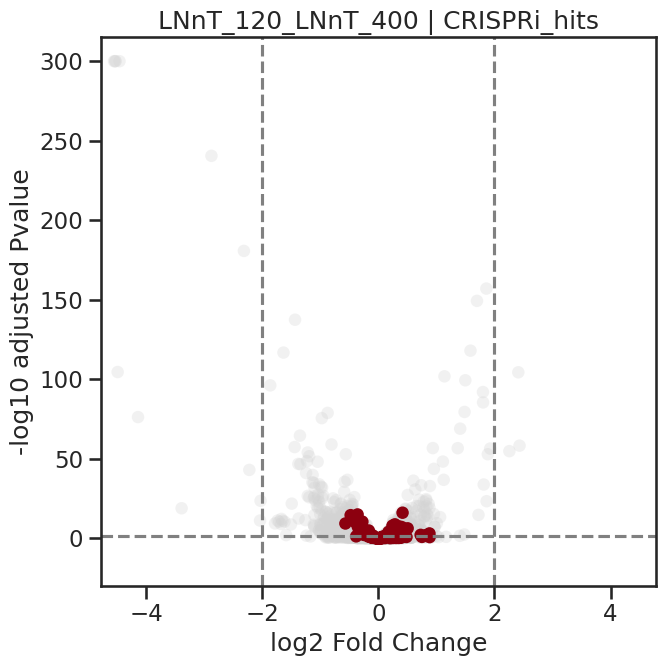

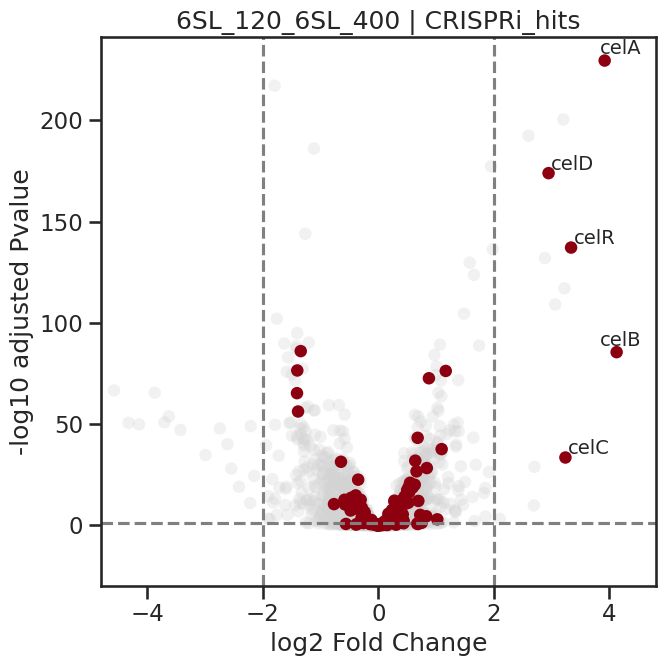

In [69]:
files_name = ["DGE_Lactose_120_Lactose_400.tsv", "DGE_LNnT_120_LNnT_400.tsv", "DGE_6SL_120_6SL_400.tsv"]

# Loop through DGE files
for fname in files_name:
    file = out_dir_V / fname
    df = pd.read_csv(file, sep="\t")
    contrast_name = file.stem.replace("DGE_", "")

    for pathway_name, genes in pathways.items():
        volcano_highlight(
            df,
            gff_df=dgVf,
            title=f"{contrast_name} | {pathway_name}",
            fc_thresh=fc_thresh,
            p_thresh=p_thresh,
            highlight_genes=genes,
            highlight_color=dict_colors[pathway_name],
            save_path=out_dir_V / f"figures/{contrast_name}_{pathway_name}_volcano.svg"
        )

In [239]:
ls ../../out/D39V/diff

ls: cannot access '../../out/D39V/diff': No such file or directory


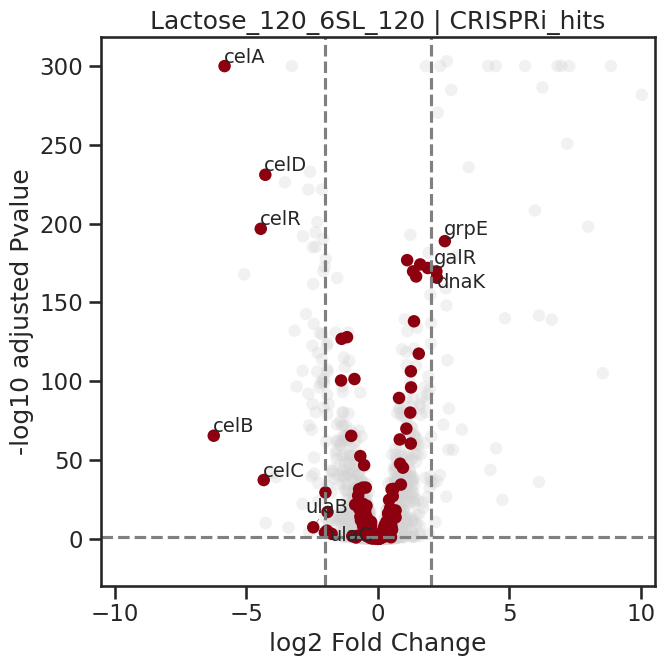

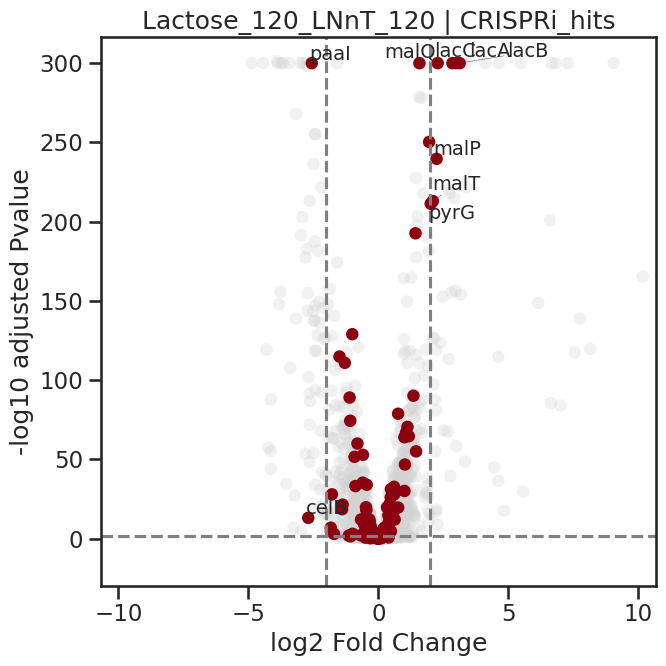

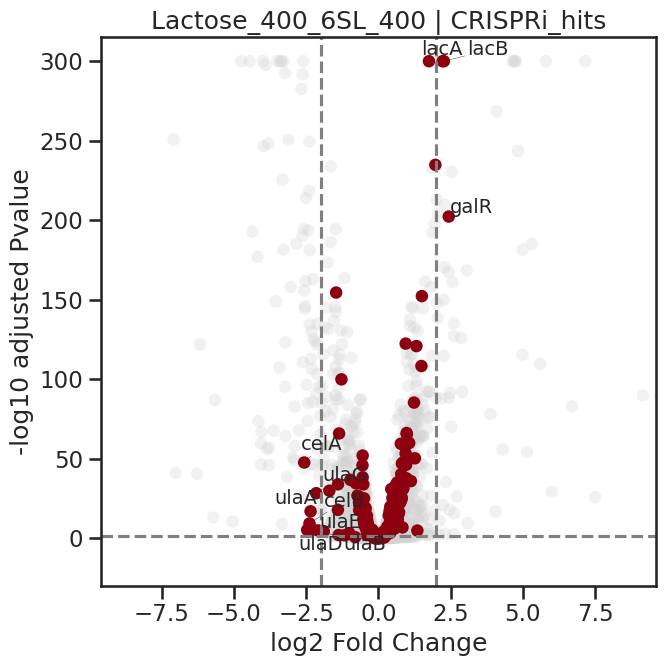

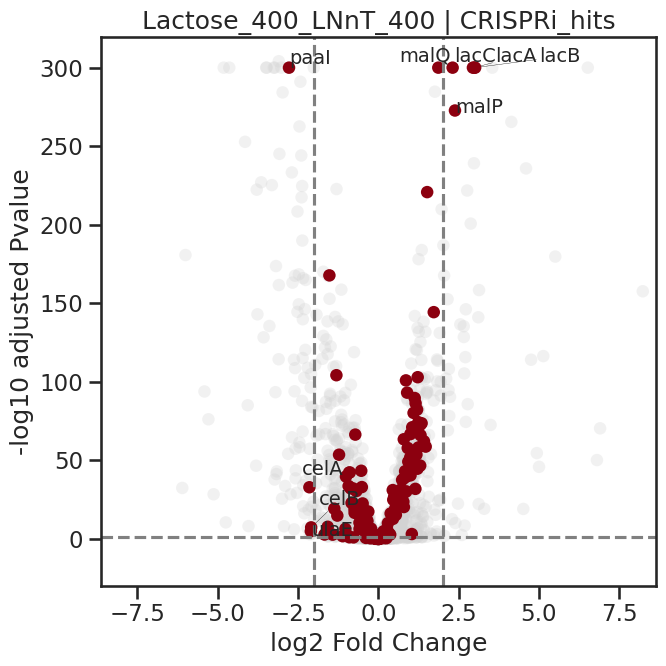

In [70]:
# files of interest are:
files_name = ["DGE_Lactose_120_6SL_120.tsv", "DGE_Lactose_120_LNnT_120.tsv", "DGE_Lactose_400_6SL_400.tsv", "DGE_Lactose_400_LNnT_400.tsv"]

# Loop through DGE files
for fname in files_name:
    file = out_dir_V / fname
    df = pd.read_csv(file, sep="\t")
    contrast_name = file.stem.replace("DGE_", "")

    for pathway_name, genes in pathways.items():
        volcano_highlight(
            df,
            gff_df=dgVf,
            title=f"{contrast_name} | {pathway_name}",
            fc_thresh=fc_thresh,
            p_thresh=p_thresh,
            highlight_genes=genes,
            highlight_color=dict_colors[pathway_name],
            save_path=out_dir_V / f"figures/{contrast_name}_{pathway_name}_volcano.png"
        )

## Plot Heatmap

In [71]:
dict_colors = {"natural_competence":"#0165fc",
              "peptide_signaling":"xkcd:grass green",
               "C_amino_sugar_Nglycans": "xkcd:pale yellow",
               "C_shikimate": "xkcd:sunflower yellow",
               "C_capsule": "xkcd:light orange",
               "Leloir_Tagatose": "xkcd:orange",
               "C_pyruvate": "xkcd:dark orange",
               "C_glycolisis": "xkcd:pumpkin",
               "C_peptidoglycan": "xkcd:burnt orange",
               "C_glycerol": "xkcd:rust",
               "C_dietary_glicans": "xkcd:reddish orange",
               "C_arginine": "xkcd:red",
               "C_phosphorylcholine": "xkcd:deep red",
               "heat_shock":"xkcd:maroon",
               "Transporters":"xkcd:light purple"
              }

pathways = {
    # sensing / regulation
    "natural_competence": "Natural competence",
    "peptide_signaling": "Peptide signaling",
    "heat_shock": "Heat shock",

    # central carbon metabolism
    "C_glycolisis": "C: Glycolysis",
    "C_pyruvate": "C: Pyruvate",
    "C_glycerol": "C: Glycerol",
    "Leloir_Tagatose": "C: Leloir-Tagatose",
    "C_shikimate": "C: Shikimate",

    # host / surface / interaction
    "C_capsule": "C: Capsule",
    "C_peptidoglycan": "C: Peptidoglycan",
    "C_phosphorylcholine": "C: Phosphorylcholine",
    "C_dietary_glicans": "C: Dietary glycans",
    "C_amino_sugar_Nglycans": "C: Amino sugar & N-glycans",

    # amino acid metabolism
    "C_arginine": "C: Arginine",

    # transporters
    "Transporters":"Transporters"
}

In [72]:
dict_colors = {"natural_competence":"#0165fc",
              "peptide_signaling":"xkcd:grass green",
               "C_amino_sugar_Nglycans": "xkcd:yellow",
               "Leloir_Tagatose": "xkcd:orange",
               "C_glycerol": "#137e6d",
               "C_dietary_glicans": "xkcd:red",
               "heat_shock":"#7e1e9c",
               "Transporters":"xkcd:light purple"
              }

pathways = {
    # sensing / regulation
    "natural_competence": "Natural competence",
    "peptide_signaling": "Peptide signaling",
    "heat_shock": "Heat shock",

    # central carbon metabolism
    "C_glycerol": "C: Glycerol",
    "Leloir_Tagatose": "C: Leloir-Tagatose",

    # host / surface / interaction

    "C_dietary_glicans": "C: Dietary glycans",
    "C_amino_sugar_Nglycans": "C: Amino sugar & N-glycans",

    # transporters
    "Transporters":"Transporters"
}

In [73]:
contrasts_V

,Condition1,Condition2
0,Lactose_120,Lactose_400
1,6SL_120,6SL_400
2,LNnT_120,LNnT_400
3,Lactose_120,LNnT_120
4,Lactose_120,6SL_120
5,Lactose_400,LNnT_400
6,Lactose_400,6SL_400
7,Lactose_120,LNnT_400
8,Lactose_120,6SL_400
9,Lactose_400,LNnT_120


In [76]:
def build_and_plot_dge_clustermap(
    contrasts_df,
    out_dir,
    gene_map_df,
    pathway_dict,
    color_dict,
):

    # =========================================================
    # GLOBAL STYLE (Nature-like)
    # =========================================================
    sns.set_theme(style="white")
    sns.set_context("paper")

    mpl.rcParams["font.family"] = "sans-serif"
    mpl.rcParams["figure.dpi"] = 150

    LABEL_SIZE = 14

    # -----------------------------
    # load contrasts
    # -----------------------------
    if not isinstance(contrasts_df, pd.DataFrame):
        contrasts_df = pd.read_csv(contrasts_df, sep="\t")

    dfs = []

    for _, row in contrasts_df.iterrows():
        c1, c2 = row["Condition1"], row["Condition2"]
        f = out_dir / f"DGE_{c1}_{c2}.tsv"

        df = pd.read_csv(f, sep="\t")
        df.columns = df.columns.str.strip()

        rename_map = {
            "log2FoldChange": "log2FoldChange",
            "Xlog2FoldChange": "log2FoldChange",
            "logFC": "log2FoldChange",
            "log2FC": "log2FoldChange",
        }

        df = df.rename(columns={k: v for k, v in rename_map.items() if k in df.columns})

        if "log2FoldChange" not in df.columns:
            raise ValueError(f"No log2FoldChange column in {f}: {df.columns.tolist()}")

        df = df[["feature_id", "log2FoldChange"]].rename(
            columns={
                "feature_id": "locus_tag",
                "log2FoldChange": f"{c1}_vs_{c2}"
            }
        )

        dfs.append(df)

    # =========================================================
    # matrix build
    # =========================================================
    mat = dfs[0]
    for df in dfs[1:]:
        mat = mat.merge(df, on="locus_tag", how="outer")

    mat = mat.merge(gene_map_df, on="locus_tag", how="left")
    mat = mat.dropna(subset=["gene_id"])

    mat = mat.groupby("gene_id").mean(numeric_only=True)
    mat = mat[[c for c in mat.columns if "_vs_" in c]]

    mat = mat.loc[mat.std(axis=1) > 0.5]

    # =========================================================
    # Z-score
    # =========================================================
    mat = mat.sub(mat.mean(axis=1), axis=0)
    mat = mat.div(mat.std(axis=1).replace(0, np.nan), axis=0).fillna(0)
    mat = mat.clip(-2.5, 2.5)

    # =========================================================
    # transpose
    # =========================================================
    mat = mat.T

    # =========================================================
    # pathway annotation
    # =========================================================
    gene_to_cluster = {
        g: cluster
        for cluster, genes in pathway_dict.items()
        for g in genes
    }

    col_clusters = pd.Series(gene_to_cluster).reindex(mat.columns)

    col_colors = col_clusters.map(color_dict).fillna("#e0e0e0")
    col_colors = pd.DataFrame({"pathway": col_colors})

    # =========================================================
    # CLUSTERMAP
    # =========================================================
    cmap = sns.diverging_palette(240, 10, as_cmap=True)

    g = sns.clustermap(
        mat,
        cmap=cmap.reversed(),
        figsize=(21, 7),

        row_cluster=True,
        col_cluster=True,

        col_colors=col_colors,
        colors_ratio=0.12,

        xticklabels=False,
        yticklabels=True,

        linewidths=0,
        cbar_kws={"label": "Z-score"},
    )

    ax = g.ax_heatmap

    # =========================================================
    # FIX LAYOUT GEOMETRY (removes white-gap artifacts)
    # =========================================================
    g.ax_row_dendrogram.set_position([0.05, 0.1, 0.08, 0.65])
    g.ax_heatmap.set_position([0.2, 0.1, 0.6, 0.65])
    g.ax_col_dendrogram.set_position([0.2, 0.78, 0.6, 0.08])
    #g.ax_col_colors.set_position([0.2, 0.73, 0.6, 0.05])
    g.ax_col_colors.set_position([0.2, 0.73, 0.6, 0.07])

    # =========================================================
    # COLORBAR (Nature-style, slim vertical)
    # =========================================================
    g.cax.set_position([0.92, 0.28, 0.015, 0.42])
    g.cax.set_title("")
    g.cax.set_yticks([-2.5, 0, 2.5])

    g.cax.tick_params(
        labelsize=LABEL_SIZE,
        length=4,
        width=4.0
    )

    for spine in g.cax.spines.values():
        spine.set_visible(False)

    for label in g.cax.get_yticklabels():
        label.set_fontweight("medium")

    # =========================================================
    # FORMAT LABELS (right side)
    # =========================================================
    def format_condition(c):
        a, b = c.split("_vs_")

        def clean(x):
            m = re.match(r"(.+)_([0-9]+)$", x)
            if m:
                name, num = m.groups()
                return f"{name} ({float(num)/1000:.3f})"
            return x

        return f"{clean(a)} vs {clean(b)}"

    ax.set_yticklabels(
        [format_condition(x.get_text()) for x in ax.get_yticklabels()],
        fontsize=LABEL_SIZE
    )

    # =========================================================
    # CLEAN separation (NO internal grid noise)
    # =========================================================
    ax.set_xticks([])
    ax.set_yticks(ax.get_yticks())

    # =========================================================
    # full border (heatmap)
    # =========================================================
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_color("black")

    # =========================================================
    # pathway strip border
    # =========================================================
    if hasattr(g, "ax_col_colors"):
        g.ax_col_colors.set_facecolor("white")

        for spine in g.ax_col_colors.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2)
            spine.set_color("black")

    # =========================================================
    # legend
    # =========================================================
    handles = [
        mpatches.Patch(color=color_dict[k], label=k)
        for k in color_dict
    ]

    g.fig.legend(
        handles=handles,
        loc="lower center",
        ncol=4,
        frameon=False,
        bbox_to_anchor=(0.5, -0.08),
        prop={"size": LABEL_SIZE}
    )

    plt.savefig('../../out/figures/heatmap.pdf',
            dpi=300,
            bbox_inches='tight',
            transparent=True)

    plt.show()

    return g, mat

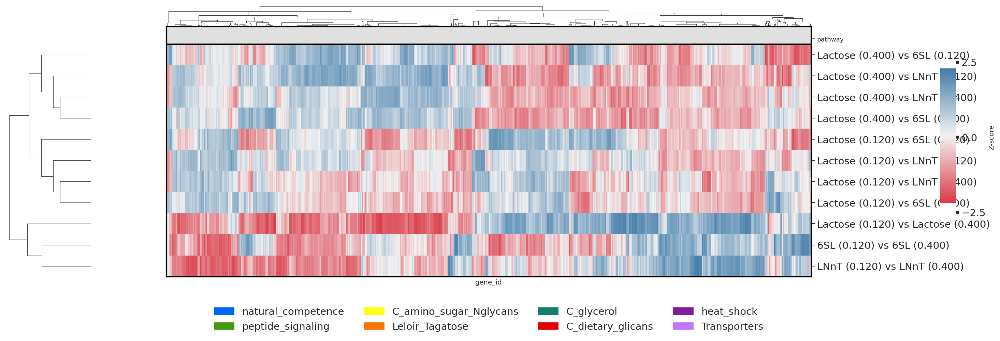

(<seaborn.matrix.ClusterGrid at 0x7fa6ccfee550>,
 gene_id                      Pn-aqpA   Pn-aqpB      aapA      ackA      acoA  \
 Lactose_120_vs_Lactose_400 -2.089520  1.192913 -1.476590  0.026602  0.203148   
 6SL_120_vs_6SL_400         -0.593593  1.397980  0.563971  1.989488  1.427947   
 LNnT_120_vs_LNnT_400       -0.779958  1.533175 -0.316179  1.208094  1.522054   
 Lactose_120_vs_LNnT_120    -0.101627 -0.654105  0.142365 -0.876540 -1.233747   
 Lactose_120_vs_6SL_120     -0.435349 -0.649577 -1.435651 -1.501695 -0.826393   
 Lactose_400_vs_LNnT_400     1.207934 -0.313843  1.302776  0.304951  0.085160   
 Lactose_400_vs_6SL_400      1.060578 -0.444509  0.604910  0.461191  0.398405   
 Lactose_120_vs_LNnT_400    -0.011448  0.266510 -0.144422 -0.166774  0.236410   
 Lactose_120_vs_6SL_400     -0.158804  0.135843 -0.842288 -0.010534  0.549656   
 Lactose_400_vs_LNnT_120     1.117754 -1.234458  1.589562 -0.404814 -1.384997   
 Lactose_400_vs_6SL_120      0.784033 -1.229930  0.011546 -1

In [77]:
build_and_plot_dge_clustermap(contrasts_df=contrast_file_V, out_dir=out_dir_V, gene_map_df=dgVf, 
                              pathway_dict=pathways, color_dict=dict_colors)

## Heatmap normalized counts (relative abundance of genes)

In [78]:
def build_and_plot_expression_clustermap(
    norm_counts,
    meta_tab,
    gene_map_df,
    pathway_dict,
    color_dict,
):

    # =========================================================
    # STYLE
    # =========================================================
    sns.set_theme(style="white")
    sns.set_context("paper")

    mpl.rcParams["font.family"] = "sans-serif"
    mpl.rcParams["figure.dpi"] = 150

    LABEL_SIZE = 14

    # =========================================================
    # INPUT
    # =========================================================
    if isinstance(norm_counts, str):
        norm_counts = pd.read_csv(norm_counts, sep="\t")

    if "feature_id" in norm_counts.columns:
        norm_counts = norm_counts.set_index("feature_id")

    meta_tab = meta_tab.copy()
    meta_tab["group"] = meta_tab["group"].astype(str)
    meta_tab = meta_tab.set_index("sample")

    # =========================================================
    # KEEP ONLY MATCHING SAMPLES (CRITICAL)
    # =========================================================
    norm_counts = norm_counts.loc[:, norm_counts.columns.intersection(meta_tab.index)]
    meta_tab = meta_tab.loc[norm_counts.columns]

    # =========================================================
    # MAP TO GENE LEVEL (SAFE MERGE)
    # =========================================================
    mat = norm_counts.merge(
        gene_map_df[["locus_tag", "gene_id"]],
        left_index=True,
        right_on="locus_tag",
        how="left"
    )

    mat = mat.dropna(subset=["gene_id"])
    mat = mat.groupby("gene_id").mean(numeric_only=True)

    # =========================================================
    # AGGREGATE REPLICATES → CONDITIONS
    # =========================================================
    mat = mat.T
    mat["group"] = meta_tab.loc[mat.index, "group"].values

    mat = mat.groupby("group").mean()
    mat = mat.T

    # =========================================================
    # VARIANCE FILTER (important for clarity)
    # =========================================================
    mat = mat.loc[mat.std(axis=1) > 0.5]

    # =========================================================
    # Z-SCORE
    # =========================================================
    mat = mat.sub(mat.mean(axis=1), axis=0)
    mat = mat.div(mat.std(axis=1).replace(0, np.nan), axis=0).fillna(0)
    mat = mat.clip(-5, 5)

    # =========================================================
    # TRANSPOSE
    # =========================================================
    mat = mat.T

    # =========================================================
    # PATHWAY COLORS
    # =========================================================
    gene_to_cluster = {
        g: cluster
        for cluster, genes in pathway_dict.items()
        for g in genes
    }

    col_clusters = pd.Series(gene_to_cluster).reindex(mat.columns)
    col_colors = col_clusters.map(color_dict).fillna("#e0e0e0")
    col_colors = pd.DataFrame({"pathway": col_colors})

    # =========================================================
    # CLUSTERMAP
    # =========================================================
    cmap = sns.diverging_palette(240, 10, as_cmap=True)

    g = sns.clustermap(
        mat,
        cmap=cmap.reversed(),
        figsize=(21, 7),
        row_cluster=True,
        col_cluster=True,
        col_colors=col_colors,
        colors_ratio=0.04,
        xticklabels=False,
        yticklabels=True,
        linewidths=0,
        cbar_kws={"label": "Z-score"},
    )

    ax = g.ax_heatmap

    # =========================================================
    # LAYOUT
    # =========================================================
    g.ax_row_dendrogram.set_position([0.05, 0.1, 0.08, 0.65])
    g.ax_heatmap.set_position([0.2, 0.1, 0.6, 0.65])
    g.ax_col_dendrogram.set_position([0.2, 0.78, 0.6, 0.08])
    g.ax_col_colors.set_position([0.2, 0.73, 0.6, 0.075])

    # =========================================================
    # COLORBAR
    # =========================================================
    g.cax.set_position([0.92, 0.28, 0.015, 0.42])
    g.cax.set_yticks([-5, -2.5, 0, 2.5, 5])

    g.cax.tick_params(labelsize=LABEL_SIZE)

    for spine in g.cax.spines.values():
        spine.set_visible(False)

    # =========================================================
    # AXES STYLE
    # =========================================================
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_color("black")

    g.ax_col_colors.set_facecolor("white")

    for spine in g.ax_col_colors.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_color("black")

    # =========================================================
    # LEGEND
    # =========================================================
    plt.savefig(
        "../../out/figures/heatmap_relative.pdf",
        dpi=300,
        bbox_inches="tight",
        transparent=True)

    plt.show()

    return g, mat

In [79]:
norm_counts_df = pd.read_csv("../../out/cpm_counts.tsv", sep="\t")
meta_df = pd.read_csv("../../data/samples.tsv", sep="\t")

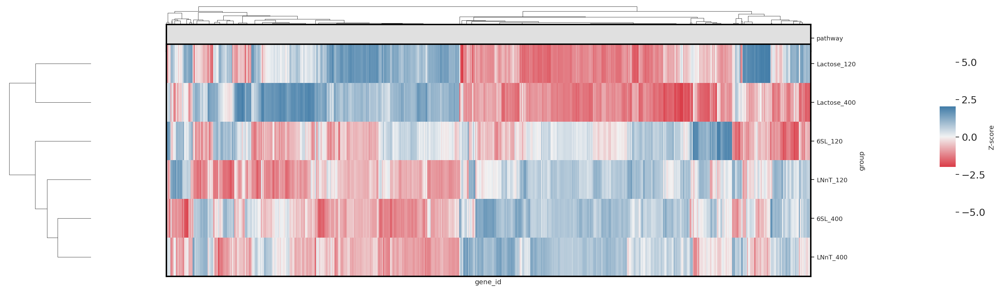

(<seaborn.matrix.ClusterGrid at 0x7fa6cc97a490>,
 gene_id       Pn-aqpA   Pn-aqpB      acoA      acoB      acoC      acoL  \
 group                                                                     
 6SL_120     -0.211476  1.108197  0.949499  0.948921  0.923199  1.011513   
 6SL_400     -0.570417  0.027884 -1.006398 -1.059829 -1.088808 -1.094361   
 LNnT_120    -0.652688  1.110998  1.526258  1.475792  1.467502  1.349748   
 LNnT_400    -0.767152 -0.156860 -0.572309 -0.740053 -0.804326 -0.923121   
 Lactose_120  0.328997 -0.640327 -0.333936 -0.145883 -0.111101 -0.019983   
 Lactose_400  1.872736 -1.449891 -0.563114 -0.478947 -0.386465 -0.323796   
 
 gene_id           adh      adh2      adhA      adhE  ...       xpt    yajC-1  \
 group                                                ...                       
 6SL_120     -1.162534 -1.435018 -1.231813 -0.453501  ... -0.775064 -0.200496   
 6SL_400      0.686004  0.422750  0.502222 -0.060652  ...  0.078336  0.665056   
 LNnT_120     0.6

In [82]:
build_and_plot_expression_clustermap(
    norm_counts=norm_counts_df,
    meta_tab=meta_df,
    gene_map_df=dgVf, 
    pathway_dict=pathways, color_dict=dict_colors
)

Matrix: 6 conditions × 1172 genes
✓  saved → ../../out/figures/heatmap_relative.pdf


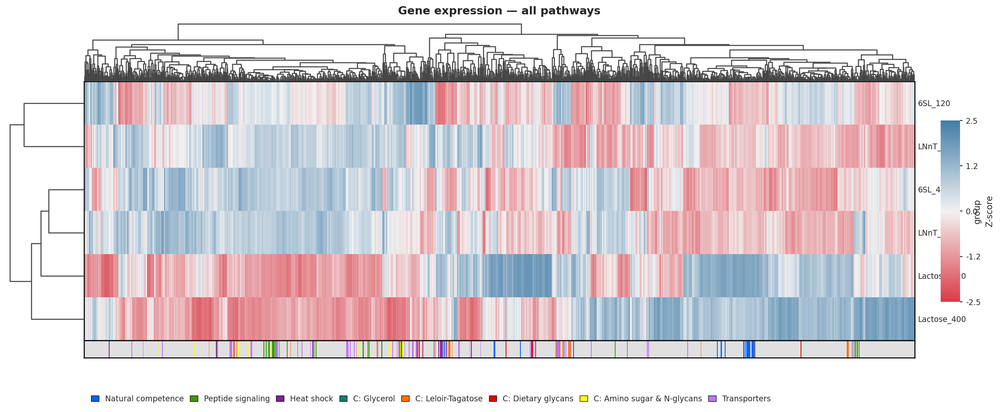

In [85]:
# ─── SETTINGS ─────────────────────────────────────────────────────────────────

out_path   = Path("../../out/figures/heatmap_relative.pdf")
Z_CLIP     = 2.5
VAR_THRESH = 0.3
LABEL_SIZE = 10
TICK_SIZE  = 9
FIG_W      = 21      # fixed figure width  (inches)
FIG_H      = 7       # fixed figure height (inches)

color_dict = {
    "Natural competence":           '#0165fc',
    "Peptide signaling":            'xkcd:grass green',
    "Heat shock":                   '#7e1e9c',
    "C: Glycerol":                  '#137e6d',
    "C: Leloir-Tagatose":           'xkcd:orange',
    "C: Dietary glycans":           'xkcd:red',
    "C: Amino sugar & N-glycans":   'xkcd:yellow',
    "Transporters":                 'xkcd:light purple',
}


pathway_dict = {
    "Natural competence":           natural_competence,
    "Peptide signaling":            peptide_signaling,
    "Heat shock":                   heat_shock,
    "C: Glycerol":                  C_glycerol,
    "C: Leloir-Tagatose":           Leloir_Tagatose,
    "C: Dietary glycans":           C_dietary_glicans,
    "C: Amino sugar & N-glycans":   C_amino_sugar_Nglycans,
    "Transporters":                 Transporters,
}

# ─── STYLE ────────────────────────────────────────────────────────────────────

sns.set_theme(style="white")
sns.set_context("paper")
mpl.rcParams["font.family"]  = "DejaVu Sans"
mpl.rcParams["figure.dpi"]   = 150
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["svg.fonttype"] = "none"

# ─── PREPROCESSING ────────────────────────────────────────────────────────────

nc = norm_counts_df.copy()
if "feature_id" in nc.columns:
    nc = nc.set_index("feature_id")

meta = meta_df.copy()
if "sample" in meta.columns:
    meta = meta.set_index("sample")
meta["group"] = meta["group"].astype(str)

shared = nc.columns.intersection(meta.index)
if shared.empty:
    raise ValueError("No overlapping samples between norm_counts_df and meta_df.")
nc, meta = nc[shared], meta.loc[shared]

gene_map = dgVf[["locus_tag", "gene_id"]].dropna(subset=["gene_id"]).drop_duplicates()

mat = (
    nc.merge(gene_map, left_index=True, right_on="locus_tag", how="left")
      .dropna(subset=["gene_id"])
      .groupby("gene_id").mean(numeric_only=True)
)
mat = mat.T.copy()
mat["group"] = meta.loc[mat.index, "group"].values
mat = mat.groupby("group").mean().T

mat = mat.loc[mat.std(axis=1) > VAR_THRESH]
mat = (mat.sub(mat.mean(axis=1), axis=0)
          .div(mat.std(axis=1).replace(0, np.nan), axis=0)
          .fillna(0).clip(-Z_CLIP, Z_CLIP))

mat_full = mat.T    # conditions × genes
print(f"Matrix: {mat_full.shape[0]} conditions × {mat_full.shape[1]} genes")

# ─── CLUSTERING ───────────────────────────────────────────────────────────────

def _lnk(data):
    return hierarchy.linkage(pdist(data, metric="euclidean"), method="average")

n_conds, n_genes = mat_full.shape
row_link  = _lnk(mat_full.values)   if n_conds > 2 else None
col_link  = _lnk(mat_full.values.T) if n_genes > 2 else None
row_order = hierarchy.leaves_list(row_link) if row_link is not None else range(n_conds)
col_order = hierarchy.leaves_list(col_link) if col_link is not None else range(n_genes)
mat_plot  = mat_full.iloc[row_order, col_order]

# ─── PATHWAY COLOR PER GENE COLUMN ────────────────────────────────────────────

gene_to_pw = {g: pw for pw, genes in pathway_dict.items() for g in genes}
col_colors = (
    pd.Series(mat_plot.columns)
      .map(gene_to_pw).map(color_dict)
      .fillna("#e0e0e0").values
)

# ─── FIXED FIGURE GEOMETRY ────────────────────────────────────────────────────
# All values are fractions of FIG_W / FIG_H

# fixed proportional zones  (left→right)
frac_rdend  = 0.06    # row dendrogram
frac_heat   = 0.64    # heatmap
frac_cgap   = 0.02    # gap before colorbar
frac_cbar   = 0.015   # colorbar
# remainder goes to right label padding

# fixed proportional zones  (bottom→top)
frac_strip  = 0.04    # pathway color strip (no labels)
frac_heat_h = 0.60    # heatmap
frac_cdend  = 0.14    # col dendrogram
frac_top    = 0.10    # title space
# remainder = bottom padding

frac_bot    = 1.0 - frac_strip - frac_heat_h - frac_cdend - frac_top

l_rdend = 0.02
l_heat  = l_rdend + frac_rdend
b_strip = frac_bot
b_heat  = b_strip + frac_strip
b_cdend = b_heat  + frac_heat_h

ax_heat  = fig = None   # defined below after fig creation
fig = plt.figure(figsize=(FIG_W, FIG_H))

ax_heat  = fig.add_axes([l_heat,              b_heat,   frac_heat,  frac_heat_h])
ax_rdend = fig.add_axes([l_rdend,             b_heat,   frac_rdend, frac_heat_h])
ax_cdend = fig.add_axes([l_heat,              b_cdend,  frac_heat,  frac_cdend])
ax_strip = fig.add_axes([l_heat,              b_strip,  frac_heat,  frac_strip])
ax_cbar  = fig.add_axes([l_heat + frac_heat + frac_cgap, b_heat + frac_heat_h * 0.15,
                          frac_cbar, frac_heat_h * 0.7])

# ─── HEATMAP ──────────────────────────────────────────────────────────────────

cmap = sns.diverging_palette(240, 10, as_cmap=True).reversed()
im   = ax_heat.imshow(mat_plot.values, aspect="auto", cmap=cmap,
                       vmin=-Z_CLIP, vmax=Z_CLIP, interpolation="nearest")

ax_heat.set_yticks(range(n_conds))
ax_heat.set_yticklabels(mat_plot.index, fontsize=TICK_SIZE)
ax_heat.yaxis.set_label_position("right")
ax_heat.yaxis.tick_right()
ax_heat.set_ylabel("group", fontsize=LABEL_SIZE, labelpad=8)
ax_heat.set_xticks([])
ax_heat.tick_params(length=0)
for sp in ax_heat.spines.values():
    sp.set_visible(True); sp.set_linewidth(1.2); sp.set_color("black")

# ─── DENDROGRAMS ──────────────────────────────────────────────────────────────

_dkw = dict(color_threshold=0, above_threshold_color="#444",
            link_color_func=lambda k: "#444", no_labels=True)

if row_link is not None:
    hierarchy.dendrogram(row_link, ax=ax_rdend, orientation="left", **_dkw)
ax_rdend.axis("off")

if col_link is not None:
    hierarchy.dendrogram(col_link, ax=ax_cdend, orientation="top", **_dkw)
ax_cdend.axis("off")

# ─── PATHWAY COLOR STRIP (no gene labels) ─────────────────────────────────────

for i, color in enumerate(col_colors):
    ax_strip.add_patch(plt.Rectangle((i - 0.5, 0), 1, 1, color=color, lw=0))
ax_strip.set_xlim(-0.5, n_genes - 0.5)
ax_strip.set_ylim(0, 1)
ax_strip.set_xticks([])
ax_strip.set_yticks([])
for sp in ax_strip.spines.values():
    sp.set_visible(True); sp.set_linewidth(1.2); sp.set_color("black")

# ─── COLORBAR ─────────────────────────────────────────────────────────────────

cb = fig.colorbar(im, cax=ax_cbar)
cb.set_ticks(np.linspace(-Z_CLIP, Z_CLIP, 5))
cb.set_ticklabels([f"{v:.1f}" for v in np.linspace(-Z_CLIP, Z_CLIP, 5)])
cb.set_label("Z-score", fontsize=LABEL_SIZE, labelpad=6)
cb.ax.tick_params(labelsize=TICK_SIZE, length=3)
for sp in cb.ax.spines.values():
    sp.set_visible(False)

# ─── TITLE ────────────────────────────────────────────────────────────────────

fig.text(l_heat + frac_heat / 2, b_cdend + frac_cdend + 0.01,
         "Gene expression — all pathways",
         ha="center", va="bottom",
         fontsize=LABEL_SIZE + 3, fontweight="bold")

# ─── LEGEND ───────────────────────────────────────────────────────────────────

present_pws = {gene_to_pw[g] for g in mat_plot.columns if g in gene_to_pw}
handles = [
    mpatches.Patch(facecolor=c, edgecolor="black", linewidth=0.6, label=pw)
    for pw, c in color_dict.items() if pw in present_pws
]
fig.legend(
    handles=handles,
    loc="lower left",
    bbox_to_anchor=(l_heat, 0.0),
    frameon=False,
    fontsize=TICK_SIZE,
    ncol=len(handles),        # all in one row below the strip
    handlelength=1.0,
    handleheight=0.85,
    columnspacing=0.8,
)

# ─── SAVE ─────────────────────────────────────────────────────────────────────

out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(out_path, dpi=300, bbox_inches="tight", transparent=True)
print(f"✓  saved → {out_path}")
plt.show()

### heatmap for each pathway with annotated genes

Matrix: 6 conditions × 1990 genes
  ✓  Natural competence  (21 genes)  →  ../../out/figures/per_pathway/heatmap_Natural_competence.pdf


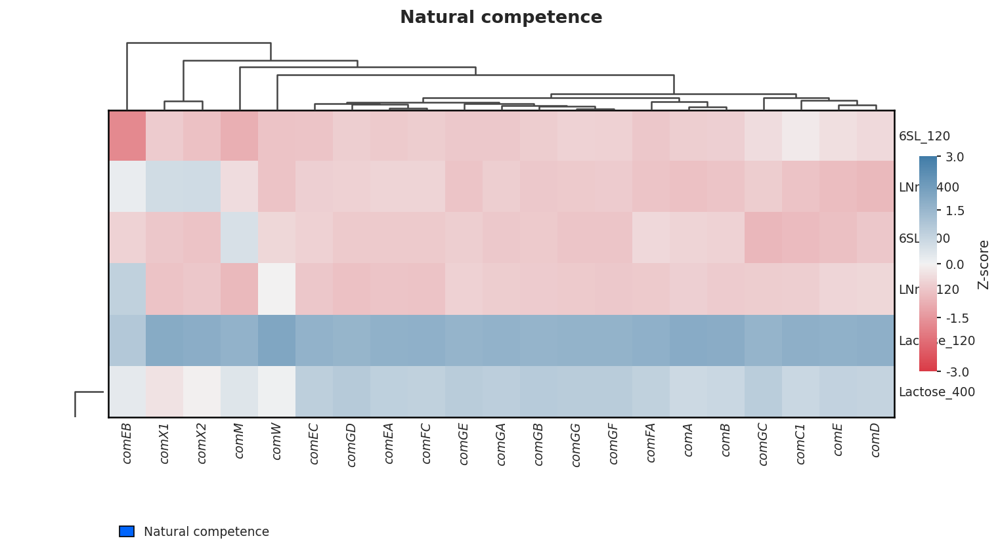

  ✓  Peptide signaling  (28 genes)  →  ../../out/figures/per_pathway/heatmap_Peptide_signaling.pdf


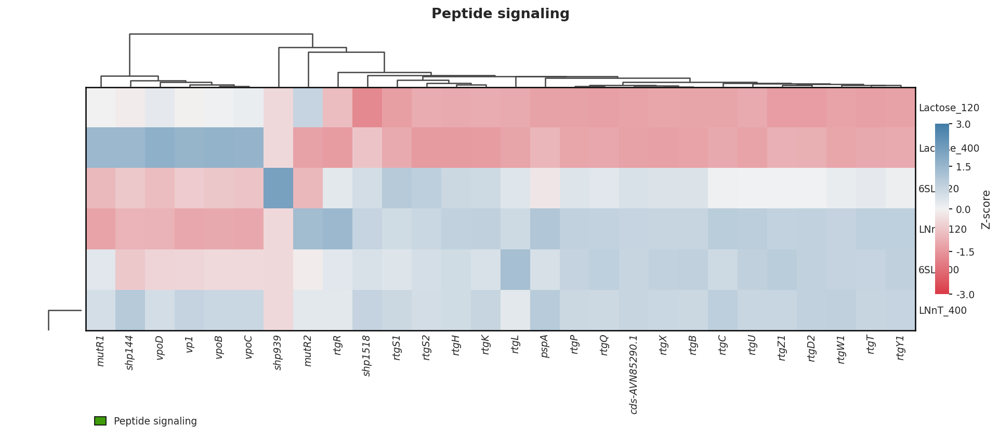

  ✓  Heat shock  (31 genes)  →  ../../out/figures/per_pathway/heatmap_Heat_shock.pdf


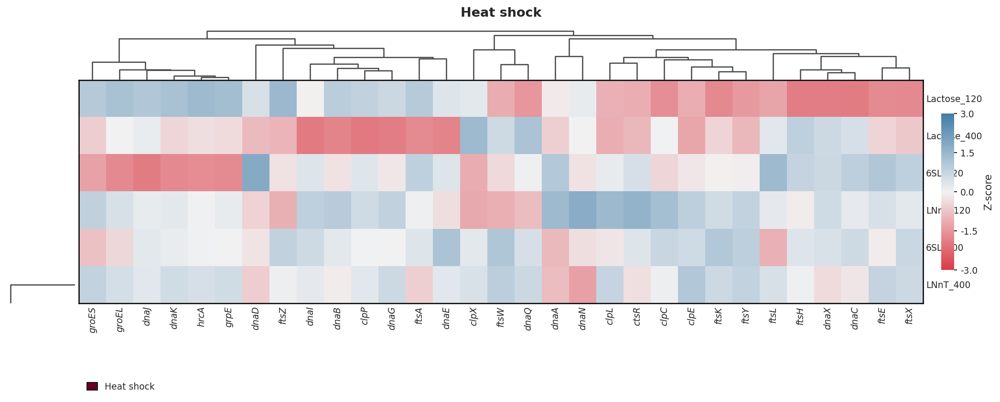

  ✓  C: Glycerol  (3 genes)  →  ../../out/figures/per_pathway/heatmap_C_Glycerol.pdf


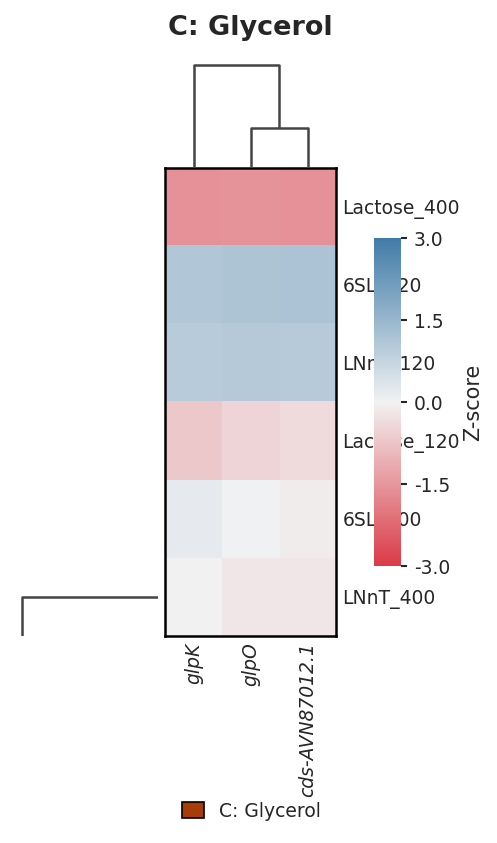

  ✓  C: Leloir-Tagatose  (27 genes)  →  ../../out/figures/per_pathway/heatmap_C_Leloir-Tagatose.pdf


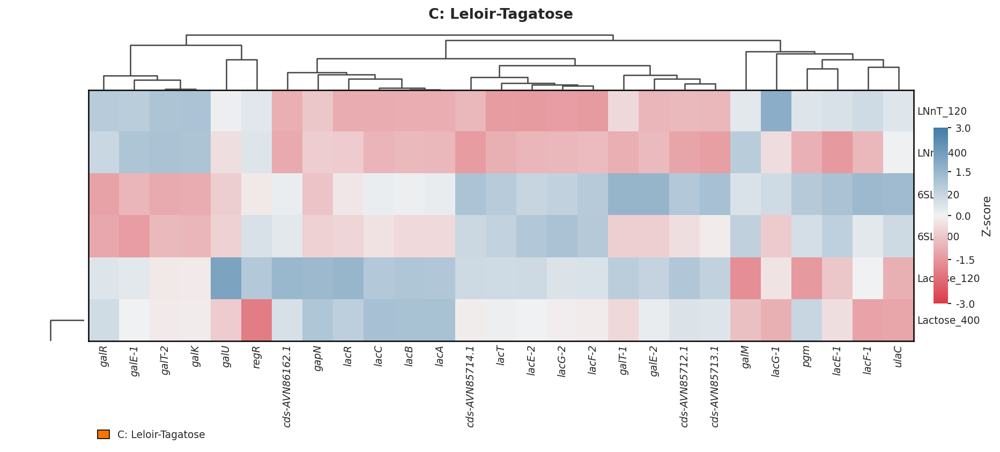

  ✓  C: Dietary glycans  (20 genes)  →  ../../out/figures/per_pathway/heatmap_C_Dietary_glycans.pdf


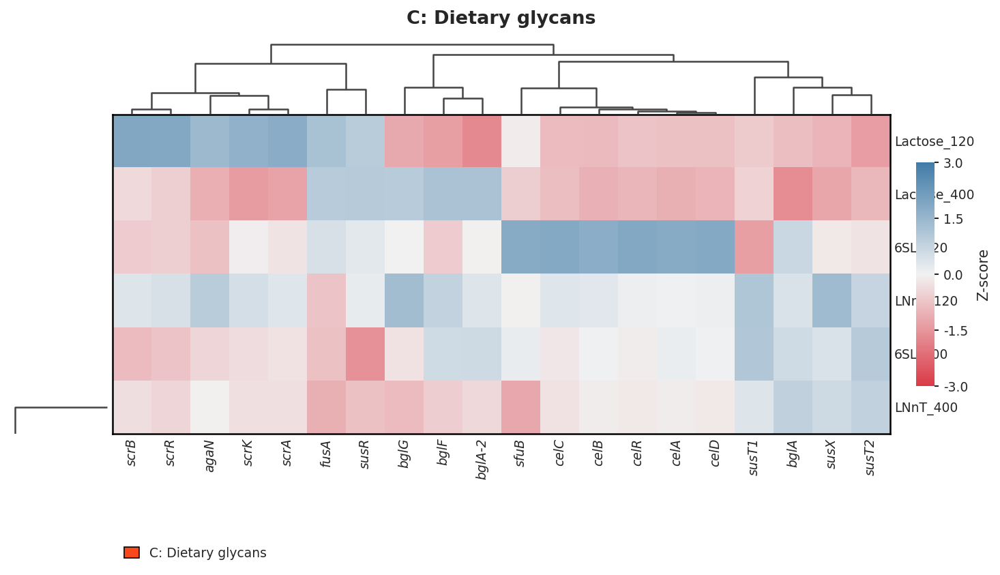

  ✓  C: Amino sugar & N-glycans  (36 genes)  →  ../../out/figures/per_pathway/heatmap_C_Amino_sugar_&_N-glycans.pdf


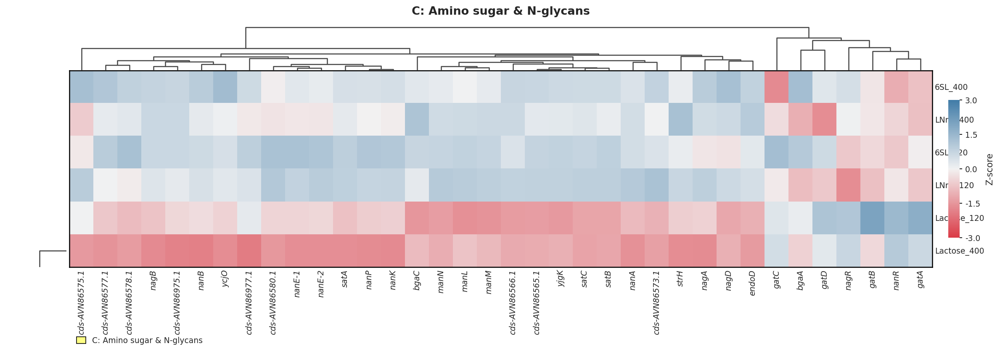

  ✓  Transporters  (70 genes)  →  ../../out/figures/per_pathway/heatmap_Transporters.pdf


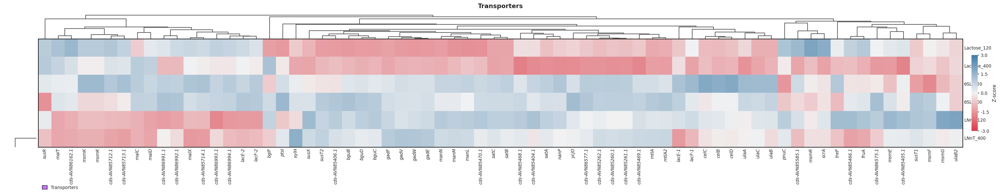

In [86]:
# ─── INPUTS ───────────────────────────────────────────────────────────────────

out_dir = Path("../../out/figures/per_pathway")

color_dict = {
    "Natural competence":           '#0165fc',
    "Peptide signaling":            'xkcd:grass green',
    "Heat shock":                   'xkcd:maroon',
    "C: Glycerol":                  'xkcd:rust',
    "C: Leloir-Tagatose":           'xkcd:orange',
    "C: Dietary glycans":           'xkcd:reddish orange',
    "C: Amino sugar & N-glycans":   'xkcd:pale yellow',
    "Transporters":                 'xkcd:light purple',
}

pathway_dict = {
    "Natural competence":           natural_competence,
    "Peptide signaling":            peptide_signaling,
    "Heat shock":                   heat_shock,
    "C: Glycerol":                  C_glycerol,
    "C: Leloir-Tagatose":           Leloir_Tagatose,
    "C: Dietary glycans":           C_dietary_glicans,
    "C: Amino sugar & N-glycans":   C_amino_sugar_Nglycans,
    "Transporters":                 Transporters,
}

# ─── STYLE ────────────────────────────────────────────────────────────────────

sns.set_theme(style="white")
sns.set_context("paper")
mpl.rcParams["font.family"]      = "DejaVu Sans"
mpl.rcParams["figure.dpi"]       = 150
mpl.rcParams["pdf.fonttype"]     = 42   # editable text in Illustrator
mpl.rcParams["svg.fonttype"]     = "none"

Z_CLIP     = 3.0
VAR_THRESH = 0.0
LABEL_SIZE = 10
TICK_SIZE  = 9

# ─── PREPROCESSING ────────────────────────────────────────────────────────────

nc = norm_counts_df.copy()
if "feature_id" in nc.columns:
    nc = nc.set_index("feature_id")

meta = meta_df.copy()
if "sample" in meta.columns:
    meta = meta.set_index("sample")
meta["group"] = meta["group"].astype(str)

shared = nc.columns.intersection(meta.index)
nc     = nc[shared]
meta   = meta.loc[shared]

gene_map = dgVf[["locus_tag", "gene_id"]].dropna(subset=["gene_id"]).drop_duplicates()

mat = (
    nc
    .merge(gene_map, left_index=True, right_on="locus_tag", how="left")
    .dropna(subset=["gene_id"])
    .groupby("gene_id").mean(numeric_only=True)
)

mat = mat.T.copy()
mat["group"] = meta.loc[mat.index, "group"].values
mat = mat.groupby("group").mean().T
mat = mat.loc[mat.std(axis=1) > VAR_THRESH]
mat = (
    mat.sub(mat.mean(axis=1), axis=0)
       .div(mat.std(axis=1).replace(0, np.nan), axis=0)
       .fillna(0).clip(-Z_CLIP, Z_CLIP)
)

mat_full = mat.T    # conditions × genes
print(f"Matrix: {mat_full.shape[0]} conditions × {mat_full.shape[1]} genes")

# ─── PLOT FUNCTION ────────────────────────────────────────────────────────────

def plot_pathway_clustermap(mat_pw, pathway_name, color, out_dir,
                             z_clip=3.0, fmt="pdf"):

    n_genes  = mat_pw.shape[1]
    n_conds  = mat_pw.shape[0]

    # ── linkage ──────────────────────────────────────────────────────────
    def linkage(data):
        return hierarchy.linkage(pdist(data, metric="euclidean"),
                                 method="average")

    row_link = linkage(mat_pw.values)          if n_conds > 2 else None
    col_link = linkage(mat_pw.values.T)        if n_genes > 2 else None

    row_order = hierarchy.leaves_list(row_link) if row_link is not None else list(range(n_conds))
    col_order = hierarchy.leaves_list(col_link) if col_link is not None else list(range(n_genes))

    mat_plot = mat_pw.iloc[row_order, col_order]

    # ── figure geometry ───────────────────────────────────────────────────
    cell_w     = 0.38
    cell_h     = 0.52
    dendro_w   = 1.0    # row dendrogram width  (inches)
    dendro_h   = 0.8    # col dendrogram height (inches)
    cbar_w     = 0.18
    cbar_gap   = 0.25
    left_pad   = 0.15
    right_pad  = 0.8    # room for y tick labels
    top_pad    = 0.55   # room for title
    bot_pad    = 1.4    # room for x tick labels

    heat_w = n_genes * cell_w
    heat_h = n_conds * cell_h

    fig_w = left_pad + dendro_w + heat_w + cbar_gap + cbar_w + right_pad
    fig_h = top_pad  + dendro_h + heat_h + bot_pad

    fig = plt.figure(figsize=(fig_w, fig_h))

    # convert to [0,1] fractions
    def fx(x): return x / fig_w
    def fy(y): return y / fig_h

    # axes positions  [left, bottom, width, height]
    ax_heat  = fig.add_axes([fx(left_pad + dendro_w),
                              fy(bot_pad),
                              fx(heat_w),
                              fy(heat_h)])

    ax_rdend = fig.add_axes([fx(left_pad),
                              fy(bot_pad),
                              fx(dendro_w - 0.05),
                              fy(heat_h)])

    ax_cdend = fig.add_axes([fx(left_pad + dendro_w),
                              fy(bot_pad + heat_h),
                              fx(heat_w),
                              fy(dendro_h - 0.08)])

    ax_cbar  = fig.add_axes([fx(left_pad + dendro_w + heat_w + cbar_gap),
                              fy(bot_pad + heat_h * 0.15),
                              fx(cbar_w),
                              fy(heat_h * 0.7)])

    # ── heatmap ───────────────────────────────────────────────────────────
    cmap = sns.diverging_palette(240, 10, as_cmap=True).reversed()
    im = ax_heat.imshow(
        mat_plot.values,
        aspect="auto",
        cmap=cmap,
        vmin=-z_clip,
        vmax=z_clip,
        interpolation="nearest",
    )

    # ticks
    ax_heat.set_xticks(range(n_genes))
    ax_heat.set_xticklabels(mat_plot.columns,
                             rotation=90, fontsize=TICK_SIZE,
                             fontstyle="italic")
    ax_heat.set_yticks(range(n_conds))
    ax_heat.set_yticklabels(mat_plot.index, fontsize=TICK_SIZE)
    ax_heat.yaxis.set_label_position("right")
    ax_heat.yaxis.tick_right()
    ax_heat.tick_params(axis="both", length=0, pad=3)

    # spines
    for sp in ax_heat.spines.values():
        sp.set_visible(True)
        sp.set_linewidth(1.2)
        sp.set_color("black")

    # ── row dendrogram ────────────────────────────────────────────────────
    if row_link is not None:
        hierarchy.dendrogram(
            row_link,
            ax=ax_rdend,
            orientation="left",
            color_threshold=0,
            above_threshold_color="#444444",
            link_color_func=lambda k: "#444444",
            no_labels=True,
        )
    ax_rdend.axis("off")
    ax_rdend.set_ylim(ax_heat.get_ylim())

    # ── col dendrogram ────────────────────────────────────────────────────
    if col_link is not None:
        hierarchy.dendrogram(
            col_link,
            ax=ax_cdend,
            orientation="top",
            color_threshold=0,
            above_threshold_color="#444444",
            link_color_func=lambda k: "#444444",
            no_labels=True,
        )
    ax_cdend.axis("off")

    # ── colorbar ─────────────────────────────────────────────────────────
    cb = fig.colorbar(im, cax=ax_cbar)
    cb.set_ticks(np.linspace(-z_clip, z_clip, 5))
    cb.set_ticklabels([f"{v:.1f}" for v in np.linspace(-z_clip, z_clip, 5)])
    cb.set_label("Z-score", fontsize=LABEL_SIZE, labelpad=6)
    cb.ax.tick_params(labelsize=TICK_SIZE, length=3)
    for sp in cb.ax.spines.values():
        sp.set_visible(False)

    # ── title ─────────────────────────────────────────────────────────────
    fig.text(
        fx(left_pad + dendro_w + heat_w / 2),
        fy(bot_pad + heat_h + dendro_h + 0.05),
        pathway_name,
        ha="center", va="bottom",
        fontsize=LABEL_SIZE + 3,
        fontweight="bold",
    )

    # ── legend ────────────────────────────────────────────────────────────
    patch = mpatches.Patch(facecolor=color, edgecolor="black",
                           linewidth=0.8, label=pathway_name)
    fig.legend(
        handles=[patch],
        loc="lower left",
        bbox_to_anchor=(fx(left_pad + dendro_w), 0.01),
        frameon=False,
        fontsize=TICK_SIZE,
        handlelength=1.2,
        handleheight=0.9,
    )

    # ── save ──────────────────────────────────────────────────────────────
    safe     = pathway_name.replace(" ", "_").replace("/", "-").replace(":", "")
    out_path = Path(out_dir) / f"heatmap_{safe}.{fmt}"
    fig.savefig(out_path, dpi=300, bbox_inches="tight", transparent=True)
    print(f"  ✓  {pathway_name}  ({n_genes} genes)  →  {out_path}")
    plt.show()
    return fig

# ─── RUN ──────────────────────────────────────────────────────────────────────

out_dir.mkdir(parents=True, exist_ok=True)

for pathway_name, pathway_genes in pathway_dict.items():
    genes = [g for g in pathway_genes if g in mat_full.columns]
    if not genes:
        warnings.warn(f"'{pathway_name}': no genes found in matrix — skipping.")
        continue
    mat_pw = mat_full[genes]
    color  = color_dict.get(pathway_name, "#cccccc")
    plot_pathway_clustermap(mat_pw, pathway_name, color, out_dir, z_clip=Z_CLIP)